# From this lecture we will learn how to build llm from scratch using transformer

Transformers is a popular open-source deep learning library developed by Google, primarily used for natural
language processing (NLP) tasks such as language translation, text classification, and language modeling.
Transformers were introduced in 2017 by Vaswani et al. in the paper "Attention is All You Need," which
revolutionized the field of NLP by introducing a new architecture that replaces traditional recurrent neural
networks (RNNs) and convolutional neural networks (CNNs).

# Stage - 1 Data Preperation

In [1]:
# re - random expression this is used to split texts
import re
import torch

Creating Dataset

In [2]:
with open('the-verdict.txt','r',encoding='utf-8') as f:
    raw_text = f.read()

In [3]:
print("Total number of characters in the: ",len(raw_text))

Total number of characters in the:  20479


In [4]:
print(raw_text[:99])

I HAD always thought Jack Gisburn rather a cheap genius--though a good fellow enough--so it was no 


In [5]:
text = "Hello, World. This, is a test."
result = re.split(r'([,.]|\s)',text)

In [6]:
print(result)

['Hello', ',', '', ' ', 'World', '.', '', ' ', 'This', ',', '', ' ', 'is', ' ', 'a', ' ', 'test', '.', '']


In [7]:
result = [item for item in result if item.strip()]

In [8]:
print(result)

['Hello', ',', 'World', '.', 'This', ',', 'is', 'a', 'test', '.']


In [9]:
text = "Hello, World. This -- is a test?"

In [10]:
result = re.split(r'([.,?!;:"()\']|--|\s)',text)
result = [item for item in result if item.strip()]

In [11]:
print(result)

['Hello', ',', 'World', '.', 'This', '--', 'is', 'a', 'test', '?']


In [12]:
preprocessed = re.split(r'([!_,.?/"()\':;]|-|--|\s)',raw_text)
preprocessed = [item for item in preprocessed if item.strip()]

In [13]:
print(preprocessed[:30])

['I', 'HAD', 'always', 'thought', 'Jack', 'Gisburn', 'rather', 'a', 'cheap', 'genius', '-', '-', 'though', 'a', 'good', 'fellow', 'enough', '-', '-', 'so', 'it', 'was', 'no', 'great', 'surprise', 'to', 'me', 'to', 'hear', 'that']


In [14]:
print(len(preprocessed))

4863


Creating Token ID's

In [15]:
all_words = sorted(set(preprocessed))
vocab_size = len(all_words)

In [16]:
print(all_words)
print(vocab_size)

['!', '"', "'", '(', ')', ',', '-', '.', ':', ';', '?', 'A', 'Ah', 'Among', 'And', 'Are', 'Arrt', 'As', 'At', 'Be', 'Begin', 'Burlington', 'But', 'By', 'Carlo', 'Chicago', 'Claude', 'Come', 'Croft', 'Destroyed', 'Devonshire', 'Don', 'Dubarry', 'Emperors', 'Florence', 'For', 'Gallery', 'Gideon', 'Gisburn', 'Gisburns', 'Grafton', 'Greek', 'Grindle', 'Grindles', 'HAD', 'Had', 'Hang', 'Has', 'He', 'Her', 'Hermia', 'His', 'How', 'I', 'If', 'In', 'It', 'Jack', 'Jove', 'Just', 'Lord', 'Made', 'Miss', 'Money', 'Monte', 'Moon', 'Mr', 'Mrs', 'My', 'Never', 'No', 'Now', 'Nutley', 'Of', 'Oh', 'On', 'Once', 'Only', 'Or', 'Perhaps', 'Poor', 'Professional', 'Renaissance', 'Rickham', 'Riviera', 'Rome', 'Russian', 'Sevres', 'She', 'Stroud', 'Strouds', 'Suddenly', 'That', 'The', 'Then', 'There', 'They', 'This', 'Those', 'Though', 'Thwing', 'Thwings', 'To', 'Usually', 'Venetian', 'Victor', 'Was', 'We', 'Well', 'What', 'When', 'Why', 'Yes', 'You', '_', 'a', 'abdication', 'able', 'about', 'above', 'abruptl

In [17]:
vocab = {token:integer for integer,token in enumerate(all_words)}

In [18]:
print(vocab)

{'!': 0, '"': 1, "'": 2, '(': 3, ')': 4, ',': 5, '-': 6, '.': 7, ':': 8, ';': 9, '?': 10, 'A': 11, 'Ah': 12, 'Among': 13, 'And': 14, 'Are': 15, 'Arrt': 16, 'As': 17, 'At': 18, 'Be': 19, 'Begin': 20, 'Burlington': 21, 'But': 22, 'By': 23, 'Carlo': 24, 'Chicago': 25, 'Claude': 26, 'Come': 27, 'Croft': 28, 'Destroyed': 29, 'Devonshire': 30, 'Don': 31, 'Dubarry': 32, 'Emperors': 33, 'Florence': 34, 'For': 35, 'Gallery': 36, 'Gideon': 37, 'Gisburn': 38, 'Gisburns': 39, 'Grafton': 40, 'Greek': 41, 'Grindle': 42, 'Grindles': 43, 'HAD': 44, 'Had': 45, 'Hang': 46, 'Has': 47, 'He': 48, 'Her': 49, 'Hermia': 50, 'His': 51, 'How': 52, 'I': 53, 'If': 54, 'In': 55, 'It': 56, 'Jack': 57, 'Jove': 58, 'Just': 59, 'Lord': 60, 'Made': 61, 'Miss': 62, 'Money': 63, 'Monte': 64, 'Moon': 65, 'Mr': 66, 'Mrs': 67, 'My': 68, 'Never': 69, 'No': 70, 'Now': 71, 'Nutley': 72, 'Of': 73, 'Oh': 74, 'On': 75, 'Once': 76, 'Only': 77, 'Or': 78, 'Perhaps': 79, 'Poor': 80, 'Professional': 81, 'Renaissance': 82, 'Rickham': 8

In [19]:
for i,item in enumerate(vocab.items()):
    print(item)
    if i>=50:
        break

('!', 0)
('"', 1)
("'", 2)
('(', 3)
(')', 4)
(',', 5)
('-', 6)
('.', 7)
(':', 8)
(';', 9)
('?', 10)
('A', 11)
('Ah', 12)
('Among', 13)
('And', 14)
('Are', 15)
('Arrt', 16)
('As', 17)
('At', 18)
('Be', 19)
('Begin', 20)
('Burlington', 21)
('But', 22)
('By', 23)
('Carlo', 24)
('Chicago', 25)
('Claude', 26)
('Come', 27)
('Croft', 28)
('Destroyed', 29)
('Devonshire', 30)
('Don', 31)
('Dubarry', 32)
('Emperors', 33)
('Florence', 34)
('For', 35)
('Gallery', 36)
('Gideon', 37)
('Gisburn', 38)
('Gisburns', 39)
('Grafton', 40)
('Greek', 41)
('Grindle', 42)
('Grindles', 43)
('HAD', 44)
('Had', 45)
('Hang', 46)
('Has', 47)
('He', 48)
('Her', 49)
('Hermia', 50)


In [20]:
class SimpleTokenizerV1:
    def __init__(self,vocab):
        self.str_to_int = vocab
        self.int_to_srt = {i:s for s,i in vocab.items()}

    def encode(self,text):
        preprocessed = re.split(r'([!_,.?/"()\':;]|--|\s)',text)
        preprocessed = [item for item in preprocessed if item.strip()]
        ids = [self.str_to_int[s] for s in preprocessed]
        return ids
    
    def decode(self,ids):
        text = " ".join(self.int_to_srt[i] for i in ids)
        text = re.sub(r'\s+([:;,.?!"()\'])',r'\1',text)
        return text

In [21]:
tokenizer = SimpleTokenizerV1(vocab)

text = """"It's the last he painted, you know," 
           Mrs. Gisburn said with pardonable pride."""
ids = tokenizer.encode(text)
print(ids)

[1, 56, 2, 858, 997, 605, 535, 750, 5, 1135, 599, 5, 1, 67, 7, 38, 859, 1117, 759, 800, 7]


In [22]:
tokenizer.decode(ids)

'" It\' s the last he painted, you know," Mrs. Gisburn said with pardonable pride.'

In [23]:
# Adding special context tokens
all_tokens = sorted(list(set(preprocessed)))
all_tokens.extend(["<|endoftext|>", "<|unk|>"])

vocab = {token:integer for integer,token in enumerate(all_tokens)}

In [24]:
print(len(vocab.items()))

1141


In [25]:
for i, item in enumerate(list(vocab.items())[-5:]):
    print(item)

('younger', 1136)
('your', 1137)
('yourself', 1138)
('<|endoftext|>', 1139)
('<|unk|>', 1140)


In [26]:
class SimpleTokenizerV2:
    def __init__(self, vocab):
        self.str_to_int = vocab
        self.int_to_str = {i:s for s,i in vocab.items()}
    
    def encode(self,text):
        preprocessed = re.split(r'([!_,.?"()\':;]|--|\s)',text)
        preprocessed = [item for item in preprocessed if item.strip()]
        preprocessed = [
            item if item in self.str_to_int 
            else "<|unk|>" for item in preprocessed
        ]
        ids = [self.str_to_int[s] for s in preprocessed]
        return ids
    
    def decode(self, ids):
        text = " ".join([self.int_to_str[i] for i in ids])
        # Replace spaces before the specified punctuations
        text = re.sub(r'\s+([,.:;?!"()\'])', r'\1', text)
        return text

In [27]:
tokenizer1 = SimpleTokenizerV2(vocab)

text1 = "Hello, do you like tea?"
text2 = "In the sunlit terraces of the palace."

text = " <|endoftext|> ".join((text1, text2))

print(text)

Hello, do you like tea? <|endoftext|> In the sunlit terraces of the palace.


In [28]:
ids = tokenizer1.encode(text)

In [29]:
print(ids)

[1140, 5, 361, 1135, 630, 984, 10, 1139, 55, 997, 965, 993, 726, 997, 1140, 7]


In [30]:
tokenizer1.decode(ids)

'<|unk|>, do you like tea? <|endoftext|> In the sunlit terraces of the <|unk|>.'

Bytepair Encoding

GPT LLM uses byte pair encoding It is also called BPE

In [31]:
import importlib
import tiktoken

print("tiktoken version:", importlib.metadata.version("tiktoken"))

tiktoken version: 0.9.0


In [32]:
tokenizer = tiktoken.get_encoding("gpt2")

In [33]:
text = (
    "Hello, do you like tea? <|endoftext|> In the sunlit terraces"
     "of someunknownPlace."
)

integers = tokenizer.encode(text, allowed_special={"<|endoftext|>"})

print(integers)

[15496, 11, 466, 345, 588, 8887, 30, 220, 50256, 554, 262, 4252, 18250, 8812, 2114, 1659, 617, 34680, 27271, 13]


In [34]:
strings = tokenizer.decode(integers)

print(strings)

Hello, do you like tea? <|endoftext|> In the sunlit terracesof someunknownPlace.


In [35]:
integers = tokenizer.encode("Akwirw ier")
print(integers)

strings = tokenizer.decode(integers)
print(strings)

[33901, 86, 343, 86, 220, 959]
Akwirw ier


Input Target Data Pairs

In [36]:
with open(r'the-verdict.txt','r',encoding='utf-8') as f:
    raw_text = f.read()

In [37]:
enc_text = tokenizer.encode(raw_text)

In [38]:
print(len(enc_text))

5145


In [39]:
enc_sample = enc_text[:50]

In [40]:
context_size = 4

In [41]:
x = enc_sample[:context_size]
y = enc_sample[1:context_size+1]

In [42]:
print(f'x: {x}')
print(f'y:      {y}')

x: [40, 367, 2885, 1464]
y:      [367, 2885, 1464, 1807]


In [43]:
for i in range(1, context_size+1):
    context = enc_sample[:i]
    context_decoded = tokenizer.decode(context)
    desired = enc_sample[i]
    desired_decoded = tokenizer.decode([desired])

    print(context, "---->", desired)
    print(context_decoded, "---->", desired_decoded)


[40] ----> 367
I ---->  H
[40, 367] ----> 2885
I H ----> AD
[40, 367, 2885] ----> 1464
I HAD ---->  always
[40, 367, 2885, 1464] ----> 1807
I HAD always ---->  thought


Implementing Data Loader

In [44]:
from torch.utils.data import DataLoader,Dataset

In [45]:
class GPTDatasetV1(Dataset):
    def __init__(self,text,tokenizer,max_length,stride):
        super().__init__()
        self.input_ids = []
        self.target_ids = []

        token_ids = tokenizer.encode(text,allowed_special={"<|endoftext|>"})

        for i in range(0,len(token_ids)-max_length,stride):
            input_chunk = token_ids[i:i+max_length]
            target_chunk = token_ids[i+1:i+max_length+1]
            self.input_ids.append(torch.tensor(input_chunk))
            self.target_ids.append(torch.tensor(target_chunk))
    
    def __len__(self):
        return len(self.input_ids)
    
    def __getitem__(self, idx):
        return self.input_ids[idx],self.target_ids[idx]

In [46]:
def create_dataloader_v1(txt, batch_size=4, max_length=256, 
                         stride=128, shuffle=True, drop_last=True,
                         num_workers=0):

    # Initialize the tokenizer
    tokenizer = tiktoken.get_encoding("gpt2")

    # Create dataset
    dataset = GPTDatasetV1(txt, tokenizer, max_length, stride)

    # Create dataloader
    dataloader = DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=shuffle,
        drop_last=drop_last,
        num_workers=num_workers
    )

    return dataloader

In [47]:
with open("the-verdict.txt", "r", encoding="utf-8") as f:
    raw_text = f.read()

In [48]:
dataloader = create_dataloader_v1(
    raw_text, batch_size=1, max_length=4, stride=1, shuffle=False
)

data_iter = iter(dataloader)
first_batch = next(data_iter)
print(first_batch)

[tensor([[  40,  367, 2885, 1464]]), tensor([[ 367, 2885, 1464, 1807]])]


In [49]:
second_batch = next(data_iter)
print(second_batch)

[tensor([[ 367, 2885, 1464, 1807]]), tensor([[2885, 1464, 1807, 3619]])]


In [50]:
dataloader = create_dataloader_v1(raw_text, batch_size=8, max_length=4, stride=4, shuffle=False)

data_iter = iter(dataloader)
inputs, targets = next(data_iter)
print("Inputs:\n", inputs)
print("\nTargets:\n", targets)

Inputs:
 tensor([[   40,   367,  2885,  1464],
        [ 1807,  3619,   402,   271],
        [10899,  2138,   257,  7026],
        [15632,   438,  2016,   257],
        [  922,  5891,  1576,   438],
        [  568,   340,   373,   645],
        [ 1049,  5975,   284,   502],
        [  284,  3285,   326,    11]])

Targets:
 tensor([[  367,  2885,  1464,  1807],
        [ 3619,   402,   271, 10899],
        [ 2138,   257,  7026, 15632],
        [  438,  2016,   257,   922],
        [ 5891,  1576,   438,   568],
        [  340,   373,   645,  1049],
        [ 5975,   284,   502,   284],
        [ 3285,   326,    11,   287]])


Token Embeddings

In [51]:
vocab_size = 6
output_dim = 3

In [52]:
torch.manual_seed(42)
embedding_layer = torch.nn.Embedding(vocab_size,output_dim)

In [53]:
print(embedding_layer.weight)

Parameter containing:
tensor([[ 1.9269,  1.4873, -0.4974],
        [ 0.4396, -0.7581,  1.0783],
        [ 0.8008,  1.6806,  0.3559],
        [-0.6866,  0.6105,  1.3347],
        [-0.2316,  0.0418, -0.2516],
        [ 0.8599, -0.3097, -0.3957]], requires_grad=True)


In [54]:
input_ids = torch.tensor([2, 3, 5, 1])

In [55]:
print(embedding_layer(input_ids))

tensor([[ 0.8008,  1.6806,  0.3559],
        [-0.6866,  0.6105,  1.3347],
        [ 0.8599, -0.3097, -0.3957],
        [ 0.4396, -0.7581,  1.0783]], grad_fn=<EmbeddingBackward0>)


Positional Embedding

In [56]:
# 50257 was official vocab size of chatgpt small model
vocab_size = 50257
output_dim = 256

In [57]:
token_embedding_layer = torch.nn.Embedding(vocab_size, output_dim)

In [58]:
max_length = 4

In [59]:
dataloader = create_dataloader_v1(
    raw_text, batch_size=8, max_length=max_length,
    stride=max_length, shuffle=False
)

In [60]:
data_iter = iter(dataloader)
inputs, targets = next(data_iter)

In [61]:
print("Token IDs:\n", inputs)
print("\nInputs shape:\n", inputs.shape)

Token IDs:
 tensor([[   40,   367,  2885,  1464],
        [ 1807,  3619,   402,   271],
        [10899,  2138,   257,  7026],
        [15632,   438,  2016,   257],
        [  922,  5891,  1576,   438],
        [  568,   340,   373,   645],
        [ 1049,  5975,   284,   502],
        [  284,  3285,   326,    11]])

Inputs shape:
 torch.Size([8, 4])


In [62]:
token_embeddings = token_embedding_layer(inputs)
print(token_embeddings.shape)

torch.Size([8, 4, 256])


In [63]:
context_length = max_length
pos_embedding_layer = torch.nn.Embedding(context_length, output_dim)

In [64]:
pos_embeddings = pos_embedding_layer(torch.arange(max_length))
print(pos_embeddings.shape)

torch.Size([4, 256])


In [65]:
input_embeddings = token_embeddings + pos_embeddings
print(input_embeddings.shape)

torch.Size([8, 4, 256])


# Attention Mechanism

1. simplified attention mechanism

In [66]:
inputs = torch.tensor(
    [[0.43, 0.15, 0.89], # Your     (x^1)
     [0.55, 0.87, 0.66], # journey  (x^2)
     [0.57, 0.85, 0.64], # starts   (x^3)
     [0.22, 0.58, 0.33], # with     (x^4)
     [0.77, 0.25, 0.10], # one      (x^5)
     [0.05, 0.80, 0.55]] # step     (x^6)
)

In [67]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

In [68]:
words = ['Your', 'journey', 'starts', 'with', 'one', 'step']

In [69]:
x_coords = inputs[:,0].numpy()
y_coords = inputs[:,1].numpy()
z_coords = inputs[:,2].numpy()

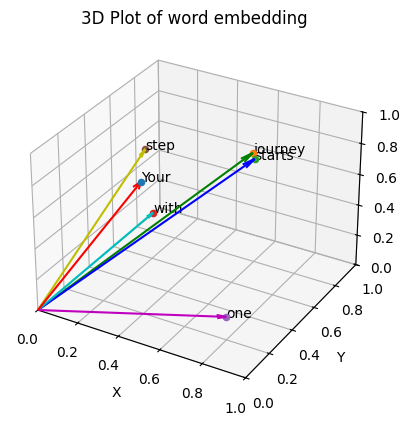

In [70]:
fig = plt.figure()
ax = fig.add_subplot(111,projection='3d')
colors = ['r', 'g', 'b', 'c', 'm', 'y']

for x,y,z,words,color in zip(x_coords,y_coords,z_coords,words,colors):
    ax.quiver(0, 0, 0, x, y, z, color=color, arrow_length_ratio=0.05)
    ax.scatter(x,y,z)
    ax.text(x,y,z,words)
    
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

ax.set_xlim([0, 1])
ax.set_ylim([0, 1])
ax.set_zlim([0, 1])

plt.title('3D Plot of word embedding')
plt.show()

In [71]:
query = inputs[1] #2nd input token is query
attn_scores = torch.empty(inputs.shape[0])

for i,x_i in enumerate(inputs):
    attn_scores[i] = torch.dot(x_i,query) #dot product transpose is not necessary everywhere

print(attn_scores)

tensor([0.9544, 1.4950, 1.4754, 0.8434, 0.7070, 1.0865])


In [72]:
attn_weight = attn_scores/attn_scores.sum()

In [73]:
print("Attention Weights: ",attn_weight)
print("Sum: ",attn_weight.sum())

Attention Weights:  tensor([0.1455, 0.2278, 0.2249, 0.1285, 0.1077, 0.1656])
Sum:  tensor(1.0000)


In [74]:
def softmax_neive(x):
    return torch.exp(x)/ torch.exp(x).sum(dim=0)

In [75]:
def softmax(x):
    return torch.softmax(x,dim=0)

In [76]:
attn_weight = softmax(attn_scores)
attn_weight2 = softmax_neive(attn_scores)

In [77]:
print("Attention Weights:",attn_weight)
print("Sum:",attn_weight.sum())
print("Attention Weights - 2:",attn_weight2)
print("Sum:",attn_weight2.sum())

Attention Weights: tensor([0.1385, 0.2379, 0.2333, 0.1240, 0.1082, 0.1581])
Sum: tensor(1.)
Attention Weights - 2: tensor([0.1385, 0.2379, 0.2333, 0.1240, 0.1082, 0.1581])
Sum: tensor(1.)


In [78]:
# context vector calculation
query = inputs[1] #2nd input is taken as query

context_vec = torch.zeros(query.shape)

for i,x_i in enumerate(inputs):
    context_vec = context_vec + attn_weight[i]*x_i

print(context_vec)

tensor([0.4419, 0.6515, 0.5683])


In [79]:
inputs1 = torch.tensor(
  [[0.43, 0.15, 0.89], # Your     (x^1)
   [0.55, 0.87, 0.66], # journey  (x^2)
   [0.57, 0.85, 0.64], # starts   (x^3)
   [0.22, 0.58, 0.33], # with     (x^4)
   [0.77, 0.25, 0.10], # one      (x^5)
   [0.05, 0.80, 0.55], # step     (x^6)
   [0.4419, 0.6515, 0.5683]] # journey-context
)

In [80]:
words1 = ['Your', 'journey', 'starts', 'with', 'one', 'step', 'journey-context']

In [81]:
# Extract x, y, z coordinates
x_coords = inputs1[:, 0].numpy()
y_coords = inputs1[:, 1].numpy()
z_coords = inputs1[:, 2].numpy()

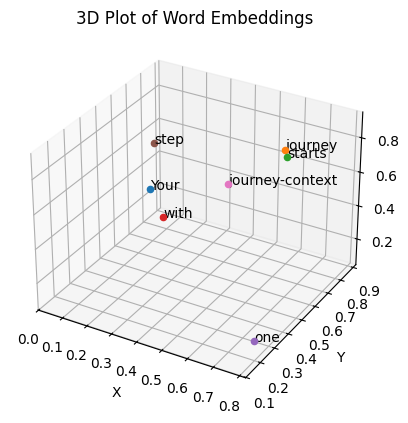

In [82]:
# Create 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot each point and annotate with corresponding word
for x, y, z, word in zip(x_coords, y_coords, z_coords, words1):
    ax.scatter(x, y, z)
    ax.text(x, y, z, word, fontsize=10)

# Set labels for axes
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.title('3D Plot of Word Embeddings')
plt.show()

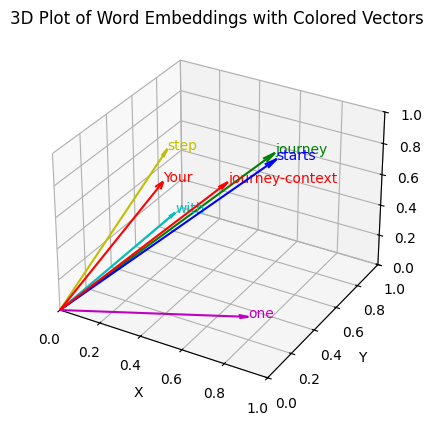

In [83]:
# Create 3D plot with vectors from origin to each point, using different colors
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Define a list of colors for the vectors
colors = ['r', 'g', 'b', 'c', 'm', 'y', 'r']

# Plot each vector with a different color and annotate with the corresponding word
for (x, y, z, word, color) in zip(x_coords, y_coords, z_coords, words1, colors):
    # Draw vector from origin to the point (x, y, z) with specified color and smaller arrow length ratio
    ax.quiver(0, 0, 0, x, y, z, color=color, arrow_length_ratio=0.05)
    ax.text(x, y, z, word, fontsize=10, color=color)

# Set labels for axes
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

# Set plot limits to keep arrows within the plot boundaries
ax.set_xlim([0, 1])
ax.set_ylim([0, 1])
ax.set_zlim([0, 1])

plt.title('3D Plot of Word Embeddings with Colored Vectors')
plt.show()

In [84]:
attn_scores = torch.empty(6, 6)

for i, x_i in enumerate(inputs):
    for j, x_j in enumerate(inputs):
        attn_scores[i,j] = torch.dot(x_i,x_j)

print(attn_scores)

tensor([[0.9995, 0.9544, 0.9422, 0.4753, 0.4576, 0.6310],
        [0.9544, 1.4950, 1.4754, 0.8434, 0.7070, 1.0865],
        [0.9422, 1.4754, 1.4570, 0.8296, 0.7154, 1.0605],
        [0.4753, 0.8434, 0.8296, 0.4937, 0.3474, 0.6565],
        [0.4576, 0.7070, 0.7154, 0.3474, 0.6654, 0.2935],
        [0.6310, 1.0865, 1.0605, 0.6565, 0.2935, 0.9450]])


In [85]:
# we do this cause two for loops are slower when we have to deal with large number of data
attn_scores = inputs @ inputs.T
print(attn_scores)

tensor([[0.9995, 0.9544, 0.9422, 0.4753, 0.4576, 0.6310],
        [0.9544, 1.4950, 1.4754, 0.8434, 0.7070, 1.0865],
        [0.9422, 1.4754, 1.4570, 0.8296, 0.7154, 1.0605],
        [0.4753, 0.8434, 0.8296, 0.4937, 0.3474, 0.6565],
        [0.4576, 0.7070, 0.7154, 0.3474, 0.6654, 0.2935],
        [0.6310, 1.0865, 1.0605, 0.6565, 0.2935, 0.9450]])


In [86]:
attn_weights = torch.softmax(attn_scores, dim=-1)
print(attn_weights)

tensor([[0.2098, 0.2006, 0.1981, 0.1242, 0.1220, 0.1452],
        [0.1385, 0.2379, 0.2333, 0.1240, 0.1082, 0.1581],
        [0.1390, 0.2369, 0.2326, 0.1242, 0.1108, 0.1565],
        [0.1435, 0.2074, 0.2046, 0.1462, 0.1263, 0.1720],
        [0.1526, 0.1958, 0.1975, 0.1367, 0.1879, 0.1295],
        [0.1385, 0.2184, 0.2128, 0.1420, 0.0988, 0.1896]])


In [87]:
row_2_sum = sum([0.1385, 0.2379, 0.2333, 0.1240, 0.1082, 0.1581])
print("Row 2 sum:", row_2_sum)
print("All row sums:", attn_weights.sum(dim=-1))

Row 2 sum: 1.0
All row sums: tensor([1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000])


To get all the final context vectors we have multiplied all the attention weights with the inputs

In [88]:
all_context_vecs = attn_weights @ inputs
print(all_context_vecs)

tensor([[0.4421, 0.5931, 0.5790],
        [0.4419, 0.6515, 0.5683],
        [0.4431, 0.6496, 0.5671],
        [0.4304, 0.6298, 0.5510],
        [0.4671, 0.5910, 0.5266],
        [0.4177, 0.6503, 0.5645]])


In [89]:
inputs2 = torch.tensor(
  [[0.43, 0.15, 0.89], # Your     (x^1)
   [0.55, 0.87, 0.66], # journey  (x^2)
   [0.57, 0.85, 0.64], # starts   (x^3)
   [0.22, 0.58, 0.33], # with     (x^4)
   [0.77, 0.25, 0.10], # one      (x^5)
   [0.05, 0.80, 0.55], # step     (x^6)
   [0.4421, 0.5931, 0.5790],
   [0.4419, 0.6515, 0.5683],
   [0.4431, 0.6496, 0.5671],
   [0.4304, 0.6298, 0.5510],
   [0.4671, 0.5910, 0.5266],
   [0.4177, 0.6503, 0.5645]]
)

words2 = ['Your', 'journey', 'starts', 'with', 'one', 'step','your-context','journey-context','begins-context','with-context','one-context','step-context']

In [90]:
# Extract x, y, z coordinates
x_coords = inputs2[:, 0].numpy()
y_coords = inputs2[:, 1].numpy()
z_coords = inputs2[:, 2].numpy()

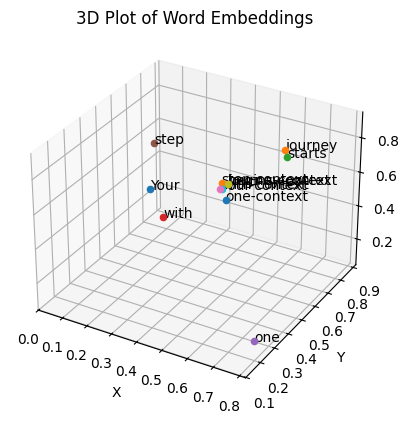

In [91]:
# Create 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot each point and annotate with corresponding word
for x, y, z, word in zip(x_coords, y_coords, z_coords, words2):
    ax.scatter(x, y, z)
    ax.text(x, y, z, word, fontsize=10)

# Set labels for axes
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.title('3D Plot of Word Embeddings')
plt.show()

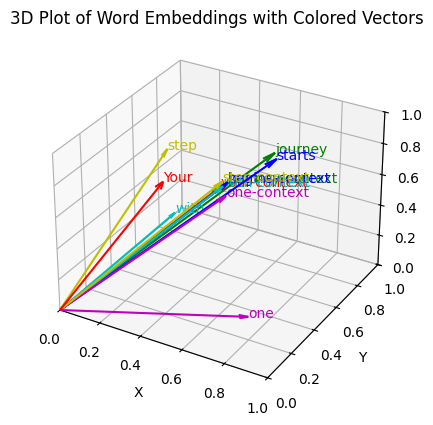

In [92]:
# Create 3D plot with vectors from origin to each point, using different colors
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Define a list of colors for the vectors
colors = ['r', 'g', 'b', 'c', 'm', 'y', 'r','g','b','c','m','y']

# Plot each vector with a different color and annotate with the corresponding word
for (x, y, z, word, color) in zip(x_coords, y_coords, z_coords, words2, colors):
    # Draw vector from origin to the point (x, y, z) with specified color and smaller arrow length ratio
    ax.quiver(0, 0, 0, x, y, z, color=color, arrow_length_ratio=0.05)
    ax.text(x, y, z, word, fontsize=10, color=color)

# Set labels for axes
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

# Set plot limits to keep arrows within the plot boundaries
ax.set_xlim([0, 1])
ax.set_ylim([0, 1])
ax.set_zlim([0, 1])

plt.title('3D Plot of Word Embeddings with Colored Vectors')
plt.show()

In [93]:
print("Previous 2nd context vector:", context_vec)

Previous 2nd context vector: tensor([0.4419, 0.6515, 0.5683])


2. Self Attention

self attention mechanism with trainable weights

2.1 Simplified Attention Mechanism

In [94]:
x_2 = inputs[1]
d_in = inputs.shape[1]
d_out = 2

first dimention of matrix should match the second dimention of input shape and second demention of matrix could be anything

In [95]:
torch.manual_seed(123)
w_query = torch.nn.Parameter(torch.rand(d_in,d_out),requires_grad=False)
w_key = torch.nn.Parameter(torch.rand(d_in,d_out),requires_grad=False)
w_value = torch.nn.Parameter(torch.rand(d_in,d_out),requires_grad=False)

In [96]:
print(w_query)

Parameter containing:
tensor([[0.2961, 0.5166],
        [0.2517, 0.6886],
        [0.0740, 0.8665]])


In [97]:
print(w_key)

Parameter containing:
tensor([[0.1366, 0.1025],
        [0.1841, 0.7264],
        [0.3153, 0.6871]])


In [98]:
print(w_value)

Parameter containing:
tensor([[0.0756, 0.1966],
        [0.3164, 0.4017],
        [0.1186, 0.8274]])


In [99]:
query_2 = x_2 @ w_query
key_2 = x_2 @ w_key
value_2 = x_2 @ w_value

In [100]:
print(query_2)

tensor([0.4306, 1.4551])


In [101]:
print(key_2)

tensor([0.4433, 1.1419])


In [102]:
print(value_2)

tensor([0.3951, 1.0037])


In [103]:
keys = inputs @ w_key
values = inputs @ w_value
queries = inputs @ w_query

In [104]:
print(queries)

tensor([[0.2309, 1.0966],
        [0.4306, 1.4551],
        [0.4300, 1.4343],
        [0.2355, 0.7990],
        [0.2983, 0.6565],
        [0.2568, 1.0533]])


In [105]:
print(keys)

tensor([[0.3669, 0.7646],
        [0.4433, 1.1419],
        [0.4361, 1.1156],
        [0.2408, 0.6706],
        [0.1827, 0.3292],
        [0.3275, 0.9642]])


In [106]:
print(values)

tensor([[0.1855, 0.8812],
        [0.3951, 1.0037],
        [0.3879, 0.9831],
        [0.2393, 0.5493],
        [0.1492, 0.3346],
        [0.3221, 0.7863]])


In [107]:
keys_2 = keys[1] #A
attn_score_22 = query_2.dot(keys_2)
print(attn_score_22)

tensor(1.8524)


In [108]:
attn_scores_2 = query_2 @ keys.T # All attention scores for given query
print(attn_scores_2)

tensor([1.2705, 1.8524, 1.8111, 1.0795, 0.5577, 1.5440])


we get attention scores by multiplying query vector with transpose of keys vector

In [109]:
attn_scores = queries @ keys.T # omega
print(attn_scores)

tensor([[0.9231, 1.3545, 1.3241, 0.7910, 0.4032, 1.1330],
        [1.2705, 1.8524, 1.8111, 1.0795, 0.5577, 1.5440],
        [1.2544, 1.8284, 1.7877, 1.0654, 0.5508, 1.5238],
        [0.6973, 1.0167, 0.9941, 0.5925, 0.3061, 0.8475],
        [0.6114, 0.8819, 0.8626, 0.5121, 0.2707, 0.7307],
        [0.8995, 1.3165, 1.2871, 0.7682, 0.3937, 1.0996]])


In [110]:
d_k = keys.shape[-1]
attn_weights_2 = torch.softmax(attn_scores_2 / d_k**0.5, dim=-1)
print(attn_weights_2)
print(d_k)

tensor([0.1500, 0.2264, 0.2199, 0.1311, 0.0906, 0.1820])
2


In [111]:
import math

In [112]:
attn_weights = torch.softmax(attn_scores/math.sqrt(d_k), dim=-1)
print(attn_weights)

tensor([[0.1551, 0.2104, 0.2059, 0.1413, 0.1074, 0.1799],
        [0.1500, 0.2264, 0.2199, 0.1311, 0.0906, 0.1820],
        [0.1503, 0.2256, 0.2192, 0.1315, 0.0914, 0.1819],
        [0.1591, 0.1994, 0.1962, 0.1477, 0.1206, 0.1769],
        [0.1610, 0.1949, 0.1923, 0.1501, 0.1265, 0.1752],
        [0.1557, 0.2092, 0.2048, 0.1419, 0.1089, 0.1794]])


In [113]:
# Define the tensor
tensor = torch.tensor([0.1, -0.2, 0.3, -0.2, 0.5])

In [114]:
# Apply softmax without scaling
softmax_result = torch.softmax(tensor, dim=-1)
print("Softmax without scaling:", softmax_result)

Softmax without scaling: tensor([0.1925, 0.1426, 0.2351, 0.1426, 0.2872])


In [115]:
# Multiply the tensor by 8 and then apply softmax
scaled_tensor = tensor * 8
softmax_scaled_result = torch.softmax(scaled_tensor, dim=-1)
print("Softmax after scaling (tensor * 8):", softmax_scaled_result)

Softmax after scaling (tensor * 8): tensor([0.0326, 0.0030, 0.1615, 0.0030, 0.8000])


In [116]:
import numpy as np

# Function to compute variance before and after scaling
def compute_variance(dim, num_trials=1000):
    dot_products = []
    scaled_dot_products = []

    # Generate multiple random vectors and compute dot products
    for _ in range(num_trials):
        q = np.random.randn(dim)
        k = np.random.randn(dim)
        
        # Compute dot product
        dot_product = np.dot(q, k)
        dot_products.append(dot_product)
        
        # Scale the dot product by sqrt(dim)
        scaled_dot_product = dot_product / np.sqrt(dim)
        scaled_dot_products.append(scaled_dot_product)
    
    # Calculate variance of the dot products
    variance_before_scaling = np.var(dot_products)
    variance_after_scaling = np.var(scaled_dot_products)

    return variance_before_scaling, variance_after_scaling

# For dimension 5
variance_before_5, variance_after_5 = compute_variance(5)
print(f"Variance before scaling (dim=5): {variance_before_5}")
print(f"Variance after scaling (dim=5): {variance_after_5}")

# For dimension 20
variance_before_100, variance_after_100 = compute_variance(100)
print(f"Variance before scaling (dim=100): {variance_before_100}")
print(f"Variance after scaling (dim=100): {variance_after_100}")



Variance before scaling (dim=5): 5.179270870991594
Variance after scaling (dim=5): 1.0358541741983187
Variance before scaling (dim=100): 103.89043173939979
Variance after scaling (dim=100): 1.0389043173939978


In [117]:
context_vec_2 = attn_weights_2 @ values
print(context_vec_2)

tensor([0.3061, 0.8210])


In [118]:
context_vector = attn_weights @ values
print(context_vector)

tensor([[0.2996, 0.8053],
        [0.3061, 0.8210],
        [0.3058, 0.8203],
        [0.2948, 0.7939],
        [0.2927, 0.7891],
        [0.2990, 0.8040]])


In [119]:
import torch.nn as nn
class SelfAttentionV1(nn.Module):
    # initializing class variables in init method wchich assigns values to key query and value matrix
    def __init__(self,d_in,d_out):
        super().__init__()
        self.w_query = nn.Parameter(torch.rand(d_in,d_out))
        self.w_key = nn.Parameter(torch.rand(d_in,d_out))
        self.w_value = nn.Parameter(torch.rand(d_in,d_out))
    
    def forward(self,x):
        queries = x @ self.w_query
        keys = x @ self.w_key
        values = x @ self.w_value
        # getting second dimentino of key vector
        d_k = keys.shape[-1]

        # getting attention scores
        attn_scores = queries @ keys.T
        # getting attention weights
        attn_weight = torch.softmax(attn_scores/d_k**0.5,dim=-1)

        # getting context vector
        context_vec = attn_weight @ values

        # returning context vector
        return context_vec

In [120]:
torch.manual_seed(123)
sa_v1 = SelfAttentionV1(d_in, d_out)
print(sa_v1(inputs))

tensor([[0.2996, 0.8053],
        [0.3061, 0.8210],
        [0.3058, 0.8203],
        [0.2948, 0.7939],
        [0.2927, 0.7891],
        [0.2990, 0.8040]], grad_fn=<MmBackward0>)


in version 2 we have just changed from parameters to linear layer for key query and value

By doing this we have inproved the performace of attention mechanism

in nn.linear uses more sophisticated initialization scheme.

In [121]:
class SelfAttentionV2(nn.Module):
    # initializing variables for class
    def __init__(self,d_in,d_out,qkv_bias=False):
        super().__init__()
        self.w_query = nn.Linear(d_in,d_out,qkv_bias)
        self.w_key = nn.Linear(d_in,d_out,qkv_bias)
        self.w_value = nn.Linear(d_in,d_out,qkv_bias)

    # forward pass 
    def forward(self,x):
        keys = self.w_key(x)
        queries = self.w_query(x)
        values = self.w_value(x)

        d_k = keys.shape[-1]
        attn_scores = queries @ keys.T
        attn_weights = torch.softmax(attn_scores/d_k**0.5, dim=-1)
        
        context_vec = attn_weights @ values

        return context_vec

In [122]:
torch.manual_seed(789)
sa_v2 = SelfAttentionV2(d_in, d_out)
print(sa_v2(inputs))

tensor([[-0.0739,  0.0713],
        [-0.0748,  0.0703],
        [-0.0749,  0.0702],
        [-0.0760,  0.0685],
        [-0.0763,  0.0679],
        [-0.0754,  0.0693]], grad_fn=<MmBackward0>)


2.2 Causal Self Attention

Causal attention is also known as masked attention and is special form of self attention mechanism.

It restircts the model to only consider previous and current inputs in a sequence, when processing given token. This is in contrast to the self attention which allows to entire input sequence at once. When computing attentino scores the causal attention mechanism ensures that the model only factors in the token that occur at on the current token in sequence. To achieve this in GPT like large language model for each token we mask out the feature token which come after current token in the input text.

In causal attention we maskout the future token's
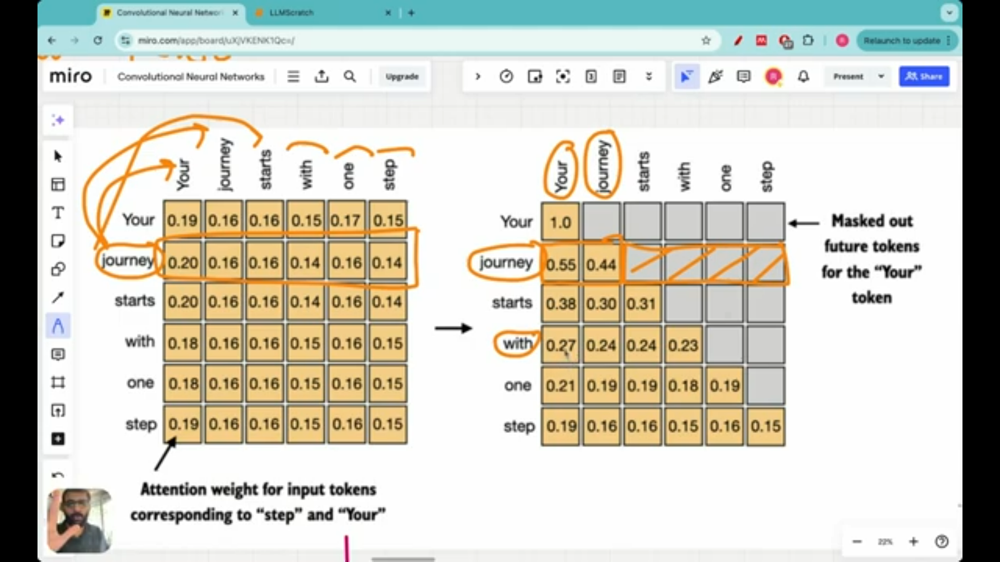

We maskout attention weight above the diagonal and we normalize the not masked attention weight so that attention weight sum upto 1 in each rows. 

In masking we put 0 at the value which we mask.

Strategy for Masked Attention Mechanism:
1. Get Attention Weights as self attention mechanism.
2. Zero out the above element of diagonal from metrics.
3. normalize the resulting metrics.

In [123]:
inputs = torch.tensor(
  [[0.43, 0.15, 0.89], # Your     (x^1)
   [0.55, 0.87, 0.66], # journey  (x^2)
   [0.57, 0.85, 0.64], # starts   (x^3)
   [0.22, 0.58, 0.33], # with     (x^4)
   [0.77, 0.25, 0.10], # one      (x^5)
   [0.05, 0.80, 0.55]] # step     (x^6)
)

In [124]:
queries = sa_v2.w_query(inputs)
keys = sa_v2.w_key(inputs)
attn_scores = queries @ keys.T
attn_weights = torch.softmax(attn_scores/keys.shape[-1]**0.5,dim=1)
print(attn_weights)

tensor([[0.1921, 0.1646, 0.1652, 0.1550, 0.1721, 0.1510],
        [0.2041, 0.1659, 0.1662, 0.1496, 0.1665, 0.1477],
        [0.2036, 0.1659, 0.1662, 0.1498, 0.1664, 0.1480],
        [0.1869, 0.1667, 0.1668, 0.1571, 0.1661, 0.1564],
        [0.1830, 0.1669, 0.1670, 0.1588, 0.1658, 0.1585],
        [0.1935, 0.1663, 0.1666, 0.1542, 0.1666, 0.1529]],
       grad_fn=<SoftmaxBackward0>)


torch.tril creates a mask where the value of all the elements above diagonal is 0.

In [125]:
context_length = attn_scores.shape[0]
mask_simple = torch.tril(torch.ones(context_length,context_length))
print(mask_simple)

tensor([[1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0.],
        [1., 1., 1., 0., 0., 0.],
        [1., 1., 1., 1., 0., 0.],
        [1., 1., 1., 1., 1., 0.],
        [1., 1., 1., 1., 1., 1.]])


In [126]:
masked_simple = attn_weights * mask_simple
print(masked_simple)

tensor([[0.1921, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.2041, 0.1659, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.2036, 0.1659, 0.1662, 0.0000, 0.0000, 0.0000],
        [0.1869, 0.1667, 0.1668, 0.1571, 0.0000, 0.0000],
        [0.1830, 0.1669, 0.1670, 0.1588, 0.1658, 0.0000],
        [0.1935, 0.1663, 0.1666, 0.1542, 0.1666, 0.1529]],
       grad_fn=<MulBackward0>)


In [127]:
row_sums = masked_simple.sum(dim=1,keepdim=True)
masked_simple_norm = masked_simple/row_sums
print(row_sums)
print(masked_simple_norm)

tensor([[0.1921],
        [0.3700],
        [0.5357],
        [0.6775],
        [0.8415],
        [1.0000]], grad_fn=<SumBackward1>)
tensor([[1.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.5517, 0.4483, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.3800, 0.3097, 0.3103, 0.0000, 0.0000, 0.0000],
        [0.2758, 0.2460, 0.2462, 0.2319, 0.0000, 0.0000],
        [0.2175, 0.1983, 0.1984, 0.1888, 0.1971, 0.0000],
        [0.1935, 0.1663, 0.1666, 0.1542, 0.1666, 0.1529]],
       grad_fn=<DivBackward0>)


The above method can cause data leakage or is not efficient.

More better way or technique for causal attention mechanism

Steps:
1. Get Attention Scores
2. Mask upper triangle as infinity
3. apply softmax function

In [128]:
inputs1 = torch.tensor(
  [[0.43, 0.15, 0.89], # Your     (x^1)
   [0.55, 0.87, 0.66], # journey  (x^2)
   [0.57, 0.85, 0.64], # starts   (x^3)
   [0.22, 0.58, 0.33], # with     (x^4)
   [0.77, 0.25, 0.10], # one      (x^5)
   [0.05, 0.80, 0.55], # step     (x^6)
   [0.4419, 0.6515, 0.5683]] # journey-context
)

In [129]:
queries = sa_v2.w_query(inputs)
keys = sa_v2.w_key(inputs)
attn_scores = queries @ keys.T
attn_weights = torch.softmax(attn_scores/keys.shape[-1]**0.5,dim=1)
print(attn_weights)

tensor([[0.1921, 0.1646, 0.1652, 0.1550, 0.1721, 0.1510],
        [0.2041, 0.1659, 0.1662, 0.1496, 0.1665, 0.1477],
        [0.2036, 0.1659, 0.1662, 0.1498, 0.1664, 0.1480],
        [0.1869, 0.1667, 0.1668, 0.1571, 0.1661, 0.1564],
        [0.1830, 0.1669, 0.1670, 0.1588, 0.1658, 0.1585],
        [0.1935, 0.1663, 0.1666, 0.1542, 0.1666, 0.1529]],
       grad_fn=<SoftmaxBackward0>)


In [130]:
print(attn_scores)

tensor([[ 0.2899,  0.0716,  0.0760, -0.0138,  0.1344, -0.0511],
        [ 0.4656,  0.1723,  0.1751,  0.0259,  0.1771,  0.0085],
        [ 0.4594,  0.1703,  0.1731,  0.0259,  0.1745,  0.0090],
        [ 0.2642,  0.1024,  0.1036,  0.0186,  0.0973,  0.0122],
        [ 0.2183,  0.0874,  0.0882,  0.0177,  0.0786,  0.0144],
        [ 0.3408,  0.1270,  0.1290,  0.0198,  0.1290,  0.0078]],
       grad_fn=<MmBackward0>)


In [131]:
context_length = attn_scores.shape[0]

In [132]:
mask = torch.triu(torch.ones(context_length,context_length),diagonal=1)
masked = attn_scores.masked_fill(mask.bool(),-torch.inf)
print(masked)

tensor([[0.2899,   -inf,   -inf,   -inf,   -inf,   -inf],
        [0.4656, 0.1723,   -inf,   -inf,   -inf,   -inf],
        [0.4594, 0.1703, 0.1731,   -inf,   -inf,   -inf],
        [0.2642, 0.1024, 0.1036, 0.0186,   -inf,   -inf],
        [0.2183, 0.0874, 0.0882, 0.0177, 0.0786,   -inf],
        [0.3408, 0.1270, 0.1290, 0.0198, 0.1290, 0.0078]],
       grad_fn=<MaskedFillBackward0>)


In [133]:
attn_weights = torch.softmax(masked/keys.shape[-1]**0.5,dim=1)
print(attn_weights)

tensor([[1.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.5517, 0.4483, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.3800, 0.3097, 0.3103, 0.0000, 0.0000, 0.0000],
        [0.2758, 0.2460, 0.2462, 0.2319, 0.0000, 0.0000],
        [0.2175, 0.1983, 0.1984, 0.1888, 0.1971, 0.0000],
        [0.1935, 0.1663, 0.1666, 0.1542, 0.1666, 0.1529]],
       grad_fn=<SoftmaxBackward0>)


as sum of each row is one we don't need to normalize it further more

In [134]:
context_vector = attn_weights @ values
print(context_vector)

tensor([[0.1855, 0.8812],
        [0.2795, 0.9361],
        [0.3133, 0.9508],
        [0.2994, 0.8595],
        [0.2702, 0.7554],
        [0.2772, 0.7618]], grad_fn=<MmBackward0>)


masking additional attention with dropout. This prevents overfitting and improves generalization performance. In LLm's like GPT dropout in attention mechanism is applied in 2 specific areas.
1. After calculating attention scores.
2. after applying attention weights to value vector.

In complex code we use dropout rate of 50% which means masking out half of the attentions.

In [135]:
torch.manual_seed(123)
dropout = torch.nn.Dropout(0.5)
example = torch.ones(6,6)
print(dropout(example))

tensor([[2., 2., 0., 2., 2., 0.],
        [0., 0., 0., 2., 0., 2.],
        [2., 2., 2., 2., 0., 2.],
        [0., 2., 2., 0., 0., 2.],
        [0., 2., 0., 2., 0., 2.],
        [0., 2., 2., 2., 2., 0.]])


In [136]:
torch.manual_seed(123)
print(dropout(attn_weights))

tensor([[2.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.7599, 0.6194, 0.6206, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.4921, 0.4925, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.3966, 0.0000, 0.3775, 0.0000, 0.0000],
        [0.0000, 0.3327, 0.3331, 0.3084, 0.3331, 0.0000]],
       grad_fn=<MulBackward0>)


In [137]:
batch = torch.stack((inputs,inputs),dim=0)
print(batch.shape)

torch.Size([2, 6, 3])


In [138]:
class CausalAttention(nn.Module):
    def __init__(self,d_in,d_out,context_length,dropout,qkv_bias=False):
        super().__init__()
        self.d_out = d_out
        self.w_query = nn.Linear(d_in,d_out,bias=qkv_bias)
        self.w_key = nn.Linear(d_in,d_out,bias=qkv_bias)
        self.w_value = nn.Linear(d_in,d_out,bias=qkv_bias)
        self.dropout = nn.Dropout(dropout)
        self.register_buffer('mask',torch.triu(torch.ones(context_length,context_length),diagonal=1))
    
    def forward(self,x):
        b,num_tokens,d_in = x.shape
        queries = self.w_query(x)
        keys = self.w_key(x)
        values = self.w_value(x)
        
        attn_scores = queries @ keys.transpose(1,2)
        attn_scores.masked_fill(self.mask.bool()[:num_tokens,:num_tokens],-torch.inf)
        
        attn_weights = torch.softmax(attn_scores/keys.shape[-1]**0.5,dim=1)
        attn_weights = self.dropout(attn_weights)

        context_vec = attn_weights @ values

        return context_vec

In [139]:
x_2 = inputs[1]
d_in = inputs.shape[1]
d_out = 2

In [140]:
torch.manual_seed(123)
context_length = batch.shape[1]
ca = CausalAttention(d_in,d_out,context_length,0.0)
context_vecs = ca(batch)
print('context_vecs.shape:',context_vecs.shape)
print(context_vecs)

context_vecs.shape: torch.Size([2, 6, 2])
tensor([[[-0.5721, -0.1123],
         [-0.5402, -0.1093],
         [-0.5403, -0.1093],
         [-0.4960, -0.1005],
         [-0.5201, -0.1041],
         [-0.4985, -0.1015]],

        [[-0.5721, -0.1123],
         [-0.5402, -0.1093],
         [-0.5403, -0.1093],
         [-0.4960, -0.1005],
         [-0.5201, -0.1041],
         [-0.4985, -0.1015]]], grad_fn=<UnsafeViewBackward0>)


# MultiHead Attention Mechanism

term multihead refers to dividing the attention mechanism into multiple heads. each head operating independently.

Implementing multihead attention involves creating multiple instances of the self attention mechanism each with its own weights and then combining their outputs. This can be computationally intensive but makes LLM powerful at complex pattern recognition task.

**Main Idea** : Run the attention mechanism multiple times(in parallel) with different,learned linear projections: the result of multiplying input data by a weight matrix.

In [141]:
class MultiHeadAttentionWrapper(nn.Module):
    def __init__(self, d_in,d_out,context_length,dropout,num_heads,qkv_bias=False):
        super().__init__()
        self.heads = nn.ModuleList([CausalAttention(d_in,d_out,context_length,dropout,qkv_bias) for _ in range(num_heads)])
    
    def forward(self,x):
        return torch.cat([head(x) for head in self.heads],dim=-1)

In [142]:
inputs = torch.tensor(
    [[0.43, 0.15, 0.89], # Your     (x^1)
     [0.55, 0.87, 0.66], # journey  (x^2)
     [0.57, 0.85, 0.64], # starts   (x^3)
     [0.22, 0.58, 0.33], # with     (x^4)
     [0.77, 0.25, 0.10], # one      (x^5)
     [0.05, 0.80, 0.55]] # step     (x^6)
)

In [143]:
batch = torch.stack((inputs,inputs),dim=0)
print(batch.shape)

torch.Size([2, 6, 3])


In [144]:
torch.manual_seed(123)
context_length = batch.shape[1]
d_in,d_out = 3,2
mha = MultiHeadAttentionWrapper(d_in,d_out,context_length,0.0,num_heads=2)
context_vecs = mha(batch)
print(context_vecs)
print('Context Vectors Shape:',context_vecs.shape)

tensor([[[-0.5721, -0.1123,  0.5115,  0.3474],
         [-0.5402, -0.1093,  0.5101,  0.3466],
         [-0.5403, -0.1093,  0.5101,  0.3464],
         [-0.4960, -0.1005,  0.5006,  0.3367],
         [-0.5201, -0.1041,  0.5056,  0.3371],
         [-0.4985, -0.1015,  0.5012,  0.3395]],

        [[-0.5721, -0.1123,  0.5115,  0.3474],
         [-0.5402, -0.1093,  0.5101,  0.3466],
         [-0.5403, -0.1093,  0.5101,  0.3464],
         [-0.4960, -0.1005,  0.5006,  0.3367],
         [-0.5201, -0.1041,  0.5056,  0.3371],
         [-0.4985, -0.1015,  0.5012,  0.3395]]], grad_fn=<CatBackward0>)
Context Vectors Shape: torch.Size([2, 6, 4])


Multi Head Attention With Weights

In [145]:
class MultiHeadAttention(nn.Module):
    def __init__(self,d_in,d_out,context_length,dropout,num_heads,qkv_bias=False):
        super().__init__()
        assert (d_out % num_heads == 0),"d_out must be divisible by num_heads"
        
        self.d_out = d_out
        self.num_heads = num_heads
        self.head_dim = d_out // num_heads # reduce the projection dim to match desired output dim.

        self.w_query = nn.Linear(d_in,d_out,bias=qkv_bias)
        self.w_key = nn.Linear(d_in,d_out,bias=qkv_bias)
        self.w_value = nn.Linear(d_in,d_out,bias=qkv_bias)
        self.out_proj = nn.Linear(d_out,d_out) # linear layer to combine head outputs
        self.dropout = nn.Dropout(dropout)
        self.register_buffer("mask",torch.triu(torch.ones(context_length,context_length),diagonal=1))
    
    def forward(self,x):
        b, num_tokens, d_in = x.shape

        queries = self.w_query(x) # shape: (b,num_tokens,d_out)
        keys = self.w_key(x)
        values = self.w_value(x)

        # we implicitly split the metrix by adding a num heads dimention
        # unroll last dim: (b,num_tokens,d_out) -> (b,num_tokens,num_heads,dimention) 
        queries = queries.view(b, num_tokens, self.num_heads, self.head_dim)
        keys = keys.view(b, num_tokens, self.num_heads, self.head_dim)
        values = values.view(b, num_tokens, self.num_heads, self.head_dim)

        # transpose = (b,num_tokens,num_heads,head_dim) -> (b,num_heads,num_tokens,head_dim)
        queries = queries.transpose(1,2)
        keys = keys.transpose(1,2)
        values = values.transpose(1,2)

        # compute scaled dot product attention with causal mask
        attn_scores = queries @ keys.transpose(2,3) # dot product for each head

        mask_bool = self.mask.bool()[:num_tokens,:num_tokens]

        attn_scores.masked_fill_(mask_bool,-torch.inf)

        attn_weights = torch.softmax(attn_scores / keys.shape[-1]**0.5,dim=-1)
        attn_weights = self.dropout(attn_weights)

        context_vecs = (attn_weights @ values).transpose(1,2)

        context_vecs = context_vecs.contiguous().view(b, num_tokens, self.d_out)
        context_vecs = self.out_proj(context_vecs)

        return context_vecs

In [146]:
torch.manual_seed(123)
inputs = torch.tensor(
    [[0.43,0.15,0.89,0.55,0.87,0.66],
     [0.57,0.85,0.64,0.22,0.58,0.33],
     [0.77,0.25,0.10,0.05,0.80,0.55]]
)
batch = torch.stack((inputs,inputs),dim=0)
print(batch.shape)

batch_size,context_length,d_in = batch.shape
d_out = 6
mha = MultiHeadAttention(d_in,d_out,context_length,0.0,num_heads=2)
context_vecs = mha(batch)
print(context_vecs)
print(context_vecs.shape)

torch.Size([2, 3, 6])
tensor([[[ 0.1569, -0.0873,  0.0210,  0.0215, -0.3243, -0.2518],
         [ 0.1117, -0.0547,  0.0406, -0.0213, -0.3251, -0.2993],
         [ 0.1196, -0.0491,  0.0318, -0.0635, -0.2788, -0.2578]],

        [[ 0.1569, -0.0873,  0.0210,  0.0215, -0.3243, -0.2518],
         [ 0.1117, -0.0547,  0.0406, -0.0213, -0.3251, -0.2993],
         [ 0.1196, -0.0491,  0.0318, -0.0635, -0.2788, -0.2578]]],
       grad_fn=<ViewBackward0>)
torch.Size([2, 3, 6])


# LLM Architecture

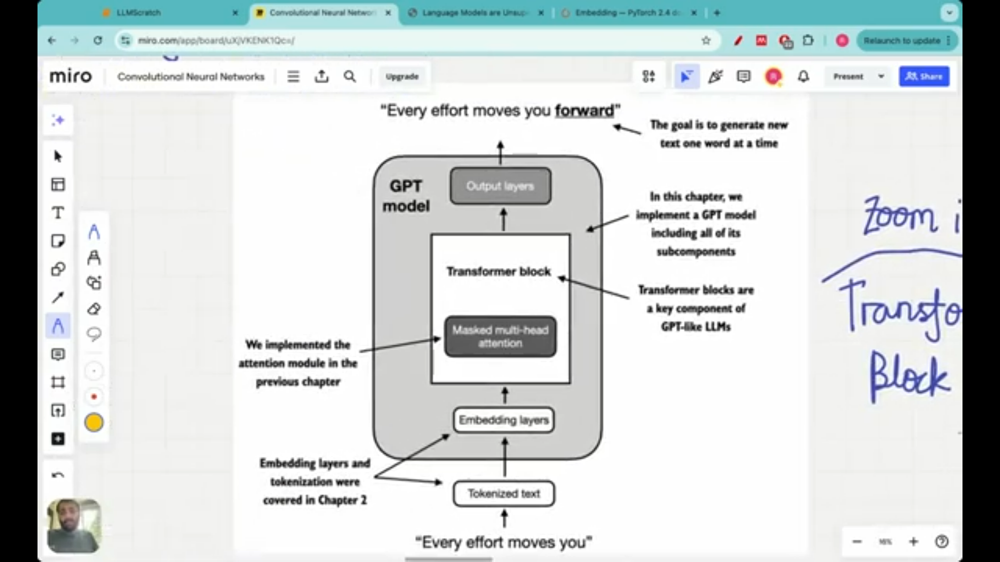

In [147]:
# GPT Configuaration for 124 M parameter small model.
GPT_CONFIG_124M ={
    'vocab_size' : 50257,
    'context_length' : 1024,
    'emb_dim' : 768,
    'n_heads' : 12,
    'n_layers' : 12,
    'drop_rate' : 0.1,
    'qkv_bias' : False
}

In [148]:
class DummyGPT(nn.Module):
    def __init__(self, cfg):
        super().__init__()
        self.tok_emb = nn.Embedding(cfg['vocab_size'],cfg['emb_dim'])
        self.pos_emb = nn.Embedding(cfg['context_length'],cfg['emb_dim'])
        self.drop_emb = nn.Dropout(cfg['drop_rate'])

        self.trf_block = nn.Sequential(*[DummyTransformerBlock(cfg) for _ in range(cfg['n_layers'])])
        self.final_norm = DummyLayerNorm(cfg['emb_dim'])
        self.out_head = nn.Linear(cfg['emb_dim'],cfg['vocab_size'],bias=False)
    
    def forward(self,in_idx):
        batch_size,seq_len = in_idx.shape
        tok_embeds = self.tok_emb(in_idx)
        pos_embeds = self.pos_emb(torch.arange(seq_len,device=in_idx.device))
        x = tok_embeds + pos_embeds
        x = self.trf_block(x)
        x = self.final_norm(x)
        logits = self.out_head(x)
        return logits
    
class DummyTransformerBlock(nn.Module):
    def __init__(self, cfg):
        super().__init__()
        # a simple placeholder
    
    def forward(self,x):
        # this block does nothing just returns its input ids
        return x

class DummyLayerNorm(nn.Module):
    def __init__(self,normalized_shape,eps=1e-5):
        super().__init__()
        # these parameters are here just to mimic the layer normalization
    
    def forward(self,x):
        return x

In [149]:
tokenizer = tiktoken.get_encoding('gpt2')
batch = []
txt1 = 'Every efforts moves you'
txt2 = 'Every day holds a'
batch.append(torch.tensor(tokenizer.encode(txt1)))
batch.append(torch.tensor(tokenizer.encode(txt2)))
batch = torch.stack(batch,dim=0)
print(batch)
batch.shape

tensor([[6109, 4040, 6100,  345],
        [6109, 1110, 6622,  257]])


torch.Size([2, 4])

In [150]:
torch.manual_seed(123)
model = DummyGPT(GPT_CONFIG_124M)
logits = model(batch)
print('Output shape:',logits.shape)
print(logits)

Output shape: torch.Size([2, 4, 50257])
tensor([[[-1.1947,  0.1392, -0.8616,  ..., -1.4987, -0.0314, -0.4490],
         [-0.7092,  1.2587, -0.3396,  ..., -0.5079,  1.2677,  1.2896],
         [ 0.7005,  1.4747, -0.4149,  ...,  1.7756, -0.2280,  0.5384],
         [ 0.4885,  1.7545, -0.6707,  ...,  1.1501, -0.1143, -0.9368]],

        [[-1.1947,  0.1392, -0.8616,  ..., -1.4987, -0.0314, -0.4490],
         [-0.5591,  0.5797, -0.1296,  ...,  0.2691,  0.3151,  1.4046],
         [ 0.8524,  1.2833, -0.1786,  ..., -0.1982,  0.1097,  0.2812],
         [-0.0190, -0.8277,  0.2299,  ...,  1.7974, -0.1646, -0.1049]]],
       grad_fn=<UnsafeViewBackward0>)


# Layer Normalization

Training deep neural network with many layers can be challenging due to vanishing gradient problem. This leads to unstable dynamics. Layer normalization improves the stability and efficiency of neural network training.

**Main Idea**: Adjust outputs of neural network to have mean zero and variance of one. This speed up the convergence.

In GPT2 Model layer normalization is typically applied before and after the multi-head attention module and before the final output layer.

In [151]:
torch.manual_seed(123)
batch_example = torch.randn(2,5)
layer = nn.Sequential(nn.Linear(5,6),nn.ReLU())
out = layer(batch_example)
print(out)

tensor([[0.2260, 0.3470, 0.0000, 0.2216, 0.0000, 0.0000],
        [0.2133, 0.2394, 0.0000, 0.5198, 0.3297, 0.0000]],
       grad_fn=<ReluBackward0>)


In [152]:
mean = out.mean(dim=-1,keepdim=True)
var = out.var(dim=-1,keepdim=True)
print("Mean:",mean)
print("Variance:",var)

Mean: tensor([[0.1324],
        [0.2170]], grad_fn=<MeanBackward1>)
Variance: tensor([[0.0231],
        [0.0398]], grad_fn=<VarBackward0>)


In [153]:
out_norm = (out-mean) / torch.sqrt(var)
out_norm_mean = out_norm.mean(dim=-1,keepdim=True)
out_norm_var = out_norm.var(dim=-1,keepdim=True)

In [154]:
torch.set_printoptions(sci_mode=False)
print("Mean after normalization:",out_norm_mean)
print("Variance after normalization:",out_norm_var)

Mean after normalization: tensor([[    0.0000],
        [    0.0000]], grad_fn=<MeanBackward1>)
Variance after normalization: tensor([[1.0000],
        [1.0000]], grad_fn=<VarBackward0>)


In [155]:
class LayerNormalization(nn.Module):
    def __init__(self,emb_dim):
        super().__init__()
        self.eps = 1e-5
        self.scale = nn.Parameter(torch.ones(emb_dim))
        self.shift = nn.Parameter(torch.zeros(emb_dim))
    
    def forward(self,x):
        mean = x.mean(dim=-1,keepdim=True)
        var = x.var(dim=-1,keepdim=True,unbiased=False)
        norm_x = (x - mean) / torch.sqrt(var + self.eps)
        return self.scale * norm_x + self.shift

In [156]:
normalize = LayerNormalization(5)
normalized_output = normalize(batch_example)

In [157]:
print(normalized_output.mean(keepdim=True,dim=-1))
print(normalized_output.var(keepdim=True,dim=-1,unbiased=False))

tensor([[    -0.0000],
        [     0.0000]], grad_fn=<MeanBackward1>)
tensor([[1.0000],
        [1.0000]], grad_fn=<VarBackward0>)


# GELU Activation Function

Two function commonly implemend in LLM's are 1. GELU and 2. SwiGLU

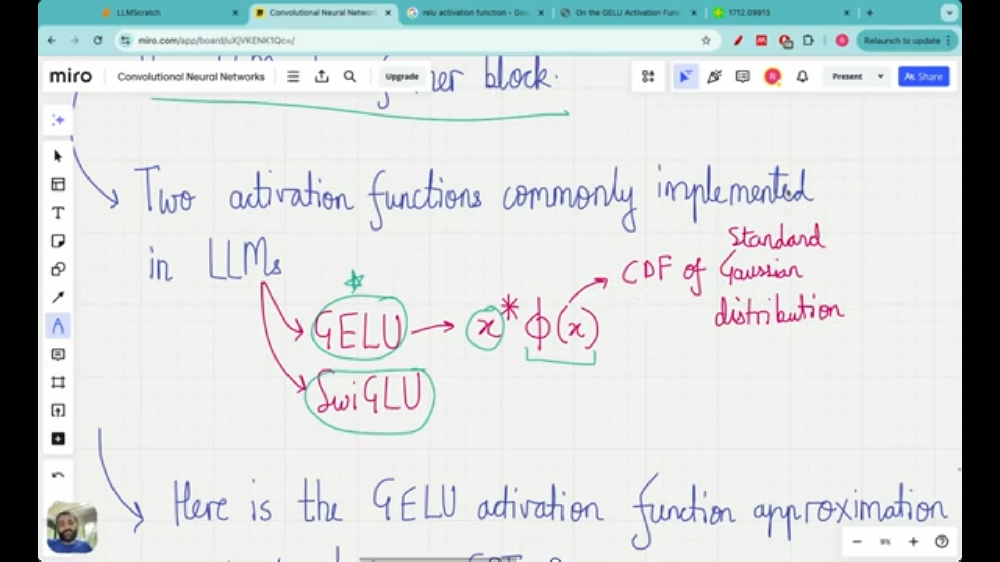

GELU(x) ~ 0.5 . x . (1+tanh[sqrt(2/pi).(x+0.0044715 . cube(x))])

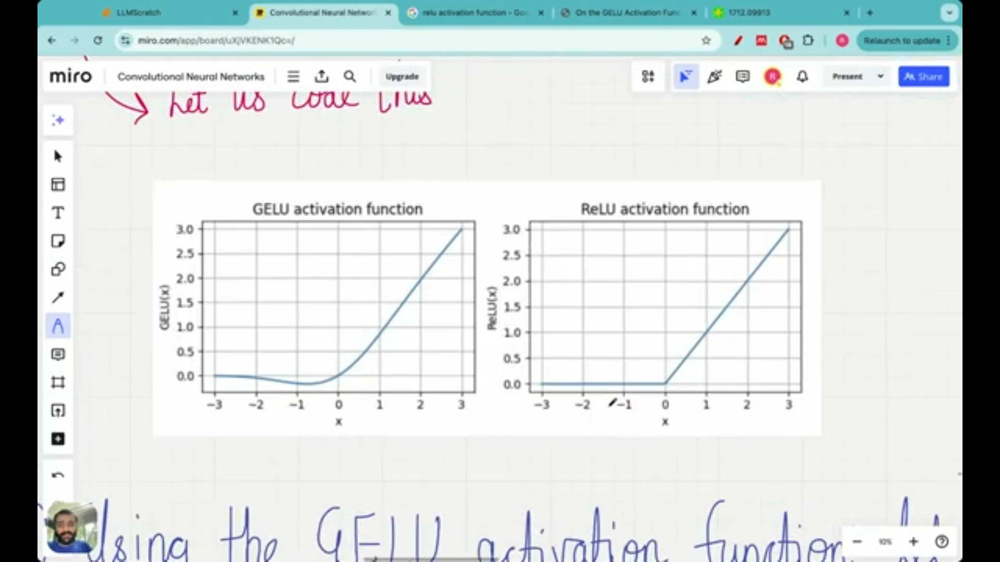

In [158]:
class GELU(nn.Module):
    def __init__(self):
        super().__init__()
    
    def forward(self,x):
        return 0.5 * x * (1+torch.tanh(torch.sqrt(torch.tensor(2.0/torch.pi)) * (x+0.044715 * torch.pow(x,3))))

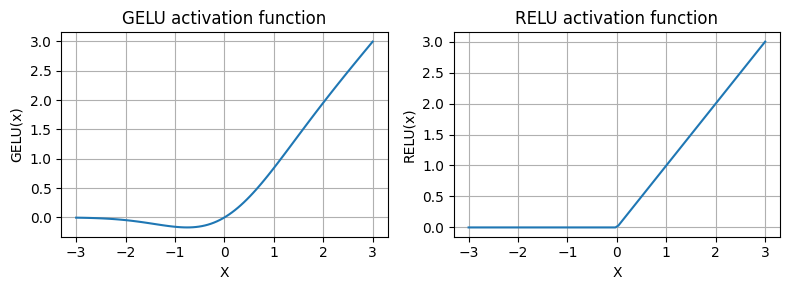

In [159]:
gelu, relu = GELU(), nn.ReLU()
x = torch.linspace(-3,3,100)
y_gelu , y_relu = gelu(x), relu(x)

plt.figure(figsize=(8,3))
for i, (y,label) in enumerate(zip([y_gelu,y_relu],['GELU','RELU']),1):
    plt.subplot(1,2,i)
    plt.plot(x,y)
    plt.title(f"{label} activation function")
    plt.xlabel("X")
    plt.ylabel(f"{label}(x)")
    plt.grid(True)

plt.tight_layout()
plt.show()

# FeedForward Layer

This is a neural network used in transformer's single block and also used in Deep Learning

Here in this neural network we have used GELU as an activation function as most of the llm's uses GELU activation function.

In [160]:
class FeedForward(nn.Module):
    def __init__(self,cfg):
        super().__init__()
        self.layers = nn.Sequential(
            nn.Linear(cfg['emb_dim'], 4 * cfg['emb_dim']),
            GELU(),
            nn.Linear(4 * cfg['emb_dim'], cfg['emb_dim']),
        )
    def forward(self,x):
        return self.layers(x)

In [161]:
ffn = FeedForward(GPT_CONFIG_124M)
x = torch.rand(2,3,768)
out = ffn(x)
print(out.shape)

torch.Size([2, 3, 768])


# Residual Connection (Shortcut connection)

Resodual connection was first introduced in the field of computer vision to solve the problem of vanishing gradients.

Residual connection creates an alternate path for the gradient to flow, by skipping one or more layers. This is achieved by adding the output of one layer to the output of latter layer.

It plays a crusial role in presenting flow of gradient during training backward pass.

In [162]:
class ExampleDeepNeuralNetwork(nn.Module):
    def __init__(self, layer_sizes, uses_shortcut):
        super().__init__()
        self.use_shortcut = uses_shortcut
        self.layers = nn.ModuleList([
            nn.Sequential(nn.Linear(layer_sizes[0],layer_sizes[1]),GELU()),
            nn.Sequential(nn.Linear(layer_sizes[1],layer_sizes[2]),GELU()),
            nn.Sequential(nn.Linear(layer_sizes[2],layer_sizes[3]),GELU()),
            nn.Sequential(nn.Linear(layer_sizes[3],layer_sizes[4]),GELU()),
            nn.Sequential(nn.Linear(layer_sizes[4],layer_sizes[5]),GELU()),
        ])
    
    def forward(self,x):
        for layer in self.layers:
            layer_output = layer(x)

            if self.use_shortcut and x.shape == layer_output.shape:
                x = x + layer_output
            else:
                x = layer_output
        return x

In [163]:
layer_sizes = [3,3,3,3,3,1]
sample_input = torch.tensor([[1.,0.,-1.]])
torch.manual_seed(123)
model_without_shortcut = ExampleDeepNeuralNetwork(layer_sizes,uses_shortcut=False)
model_with_shortcut = ExampleDeepNeuralNetwork(layer_sizes,uses_shortcut=True)

In [164]:
def print_gradients(model,x):
    output = model(x)
    target = torch.tensor([[0.]])

    loss = nn.MSELoss()
    loss = loss(output,target)

    loss.backward()

    for name, param in model.named_parameters():
        if 'weight' in name:
            print(f"{name} has gradient mean of {param.grad.abs().mean().item()}")

In [165]:
print_gradients(model_without_shortcut,sample_input)

layers.0.0.weight has gradient mean of 0.00020173587836325169
layers.1.0.weight has gradient mean of 0.0001201116101583466
layers.2.0.weight has gradient mean of 0.0007152041653171182
layers.3.0.weight has gradient mean of 0.001398873864673078
layers.4.0.weight has gradient mean of 0.005049646366387606


In [166]:
print_gradients(model_with_shortcut,sample_input)

layers.0.0.weight has gradient mean of 0.0014432319439947605
layers.1.0.weight has gradient mean of 0.004846962168812752
layers.2.0.weight has gradient mean of 0.0041389018297195435
layers.3.0.weight has gradient mean of 0.00591512955725193
layers.4.0.weight has gradient mean of 0.03265950828790665


# Transformer Block

Transformer block is a fundamental block of GPT and other LLM Architectures.

The transformer block is repeated 12 times in GPT2 small model with 124 Million Parameters.

When a transformer block processes an input sequence each element is represented by a fixed size of vector.
The operation within the tranformer block such as mha anf ffn are designed to transform  the input vectors such that their dimentionality is preserved.

**Self Attention :** Analyses the relationship between input elements.
**Feed Forward Network :** Modifies Data Individually at each position.

In [167]:
class FeedForwardNetwork(nn.Module):
    def __init__(self,cfg):
        super().__init__()
        self.layers = nn.Sequential(
            nn.Linear(cfg['emb_dim'], 4 * cfg['emb_dim']),
            GELU(),
            nn.Linear(4 * cfg['emb_dim'], cfg['emb_dim']),
        )
    def forward(self,x):
        return self.layers(x)

In [168]:
class TranformerBlock(nn.Module):
    def __init__(self, cfg):
        super().__init__()
        self.attn = MultiHeadAttention(
            d_in = cfg['emb_dim'],
            d_out = cfg['emb_dim'],
            context_length = cfg['context_length'],
            num_heads = cfg['n_heads'],
            dropout = cfg['drop_rate'],
            qkv_bias = cfg['qkv_bias']
        )
        self.ff = FeedForwardNetwork(cfg)
        self.norm1 = LayerNormalization(cfg['emb_dim'])
        self.norm2 = LayerNormalization(cfg['emb_dim'])
        self.drop_shortcut = nn.Dropout(cfg['drop_rate'])
    
    def forward(self,x):
        shortcut = x
        x = self.norm1(x)
        x = self.attn(x)
        x = self.drop_shortcut(x)
        x = x + shortcut

        shortcut = x
        
        x = self.norm2(x)
        x = self.ff(x)
        x = self.drop_shortcut(x)
        x = x + shortcut

        return x

In [169]:
torch.manual_seed(123)
x = torch.rand(2,4,768)
block = TranformerBlock(GPT_CONFIG_124M)
output = block(x)
print("Input Shape:",x.shape)
print("Output Shape:",output.shape)

Input Shape: torch.Size([2, 4, 768])
Output Shape: torch.Size([2, 4, 768])


# Entire GPT Model Architecture

We will assemble all the components of architecture together to create entire GPT model

In [170]:
# GPT Configuaration for 124 M parameter small model.
GPT_CONFIG_124M ={
    'vocab_size' : 50257,
    'context_length' : 1024,
    'emb_dim' : 768,
    'n_heads' : 12,
    'n_layers' : 12,
    'drop_rate' : 0.1,
    'qkv_bias' : False
}

GELU Activation

In [171]:
class GELU(nn.Module):
    def __init__(self):
        super().__init__()
    
    def forward(self,x):
        return 0.5 * x * (1+torch.tanh(torch.sqrt(torch.tensor(2.0/torch.pi)) * (x+0.044715 * torch.pow(x,3))))

Feed Forward Network

In [172]:
class FeedForwardNetwork(nn.Module):
    def __init__(self,cfg):
        super().__init__()
        self.layers = nn.Sequential(
            nn.Linear(cfg['emb_dim'], 4 * cfg['emb_dim']),
            GELU(),
            nn.Linear(4 * cfg['emb_dim'], cfg['emb_dim']),
        )
    def forward(self,x):
        return self.layers(x)

Layer Normalization

In [173]:
class LayerNormalization(nn.Module):
    def __init__(self,emb_dim):
        super().__init__()
        self.eps = 1e-5
        self.scale = nn.Parameter(torch.ones(emb_dim))
        self.shift = nn.Parameter(torch.zeros(emb_dim))
    
    def forward(self,x):
        mean = x.mean(dim=-1,keepdim=True)
        var = x.var(dim=-1,keepdim=True,unbiased=False)
        norm_x = (x - mean) / torch.sqrt(var + self.eps)
        return self.scale * norm_x + self.shift

Multihead Attention

In [174]:
class MultiHeadAttention(nn.Module):
    def __init__(self,d_in,d_out,context_length,dropout,num_heads,qkv_bias=False):
        super().__init__()
        assert (d_out % num_heads == 0),"d_out must be divisible by num_heads"
        
        self.d_out = d_out
        self.num_heads = num_heads
        self.head_dim = d_out // num_heads # reduce the projection dim to match desired output dim.

        self.w_query = nn.Linear(d_in,d_out,bias=qkv_bias)
        self.w_key = nn.Linear(d_in,d_out,bias=qkv_bias)
        self.w_value = nn.Linear(d_in,d_out,bias=qkv_bias)
        self.out_proj = nn.Linear(d_out,d_out) # linear layer to combine head outputs
        self.dropout = nn.Dropout(dropout)
        self.register_buffer("mask",torch.triu(torch.ones(context_length,context_length),diagonal=1))
    
    def forward(self,x):
        b, num_tokens, d_in = x.shape

        queries = self.w_query(x) # shape: (b,num_tokens,d_out)
        keys = self.w_key(x)
        values = self.w_value(x)

        # we implicitly split the metrix by adding a num heads dimention
        # unroll last dim: (b,num_tokens,d_out) -> (b,num_tokens,num_heads,dimention) 
        queries = queries.view(b, num_tokens, self.num_heads, self.head_dim)
        keys = keys.view(b, num_tokens, self.num_heads, self.head_dim)
        values = values.view(b, num_tokens, self.num_heads, self.head_dim)

        # transpose = (b,num_tokens,num_heads,head_dim) -> (b,num_heads,num_tokens,head_dim)
        queries = queries.transpose(1,2)
        keys = keys.transpose(1,2)
        values = values.transpose(1,2)

        # compute scaled dot product attention with causal mask
        attn_scores = queries @ keys.transpose(2,3) # dot product for each head

        mask_bool = self.mask.bool()[:num_tokens,:num_tokens]

        attn_scores.masked_fill_(mask_bool,-torch.inf)

        attn_weights = torch.softmax(attn_scores / keys.shape[-1]**0.5,dim=-1)
        attn_weights = self.dropout(attn_weights)

        context_vecs = (attn_weights @ values).transpose(1,2)

        context_vecs = context_vecs.contiguous().view(b, num_tokens, self.d_out)
        context_vecs = self.out_proj(context_vecs)

        return context_vecs

Transformer Block

In [175]:
class TransformerBlock(nn.Module):
    def __init__(self, cfg):
        super().__init__()
        self.attn = MultiHeadAttention(
            d_in = cfg['emb_dim'],
            d_out = cfg['emb_dim'],
            context_length = cfg['context_length'],
            num_heads = cfg['n_heads'],
            dropout = cfg['drop_rate'],
            qkv_bias = cfg['qkv_bias']
        )
        self.ff = FeedForwardNetwork(cfg)
        self.norm1 = LayerNormalization(cfg['emb_dim'])
        self.norm2 = LayerNormalization(cfg['emb_dim'])
        self.drop_shortcut = nn.Dropout(cfg['drop_rate'])
    
    def forward(self,x):
        shortcut = x
        x = self.norm1(x)
        x = self.attn(x)
        x = self.drop_shortcut(x)
        x = x + shortcut

        shortcut = x
        
        x = self.norm2(x)
        x = self.ff(x)
        x = self.drop_shortcut(x)
        x = x + shortcut

        return x

Entire GPT Model

In [176]:
class GPTModel(nn.Module):
    def __init__(self, cfg):
        super().__init__()
        self.tok_emb = nn.Embedding(cfg['vocab_size'],cfg['emb_dim'])
        self.pos_emb = nn.Embedding(cfg['context_length'],cfg['emb_dim'])
        self.drop_emb = nn.Dropout(cfg['drop_rate'])

        self.trf_block =  nn.Sequential(*[TransformerBlock(cfg) for _ in range(cfg['n_layers'])])
        self.final_norm = LayerNormalization(cfg['emb_dim'])
        self.out_head = nn.Linear(cfg['emb_dim'],cfg['vocab_size'],bias=False)
    
    def forward(self,in_idx):
        batch_size,seq_len = in_idx.shape
        tok_embeds = self.tok_emb(in_idx)
        pos_embeds = self.pos_emb(torch.arange(seq_len,device=in_idx.device))
        x = tok_embeds + pos_embeds
        x = self.trf_block(x)
        x = self.final_norm(x)
        logits = self.out_head(x)
        return logits

In [177]:
torch.manual_seed(123)
model = GPTModel(GPT_CONFIG_124M)
model.eval()
out = model(batch)
print("Input Batch:",batch)
print("Output Batch:",out.shape)

Input Batch: tensor([[6109, 4040, 6100,  345],
        [6109, 1110, 6622,  257]])
Output Batch: torch.Size([2, 4, 50257])


We are getting 164 Million parameters and GPT has 124 Million Parameters this actually happend because of concept called weight tying from token embedding layer in its output layer.

In GPT2 model parameters weights are reused. that's why it becomes lesser to 124 Million

In [178]:
total_params = sum(p.numel() for p in model.parameters())
print(f"Total number of parameters: {total_params:,}")

Total number of parameters: 163,009,536


In [179]:
print("Token Embedding Layers Shape",model.tok_emb.weight.shape)
print("Output Layer Shape:",model.out_head.weight.shape)

Token Embedding Layers Shape torch.Size([50257, 768])
Output Layer Shape: torch.Size([50257, 768])


In [180]:
total_params_gpt2 =  total_params - sum(p.numel() for p in model.out_head.parameters())
print(f"Number of trainable parameters considering weight tying: {total_params_gpt2:,}")

Number of trainable parameters considering weight tying: 124,412,160


In [181]:
total_size_bytes = total_params * 4
toatl_size_mb = total_size_bytes / (1024*1024)
print(f"Total size of model : {toatl_size_mb:.2f} MB")

Total size of model : 621.83 MB


# Generating Text from output tokens

To generate text from output tensor we will extract the last row from tensor and then will apply softmax function for last row tensor logits and then will generate probabilities and then will extract that token id with highest probability and then we will decode that and give it to previous input for next round.

Steps:
1. Encode text into token ID's
2. Get output Metrix from GPT Model
3. Extact Last row of output metrix and name it logits.
4. converts logits into probability by using softmax function
5. Identify index position of largest value which also represents token id.
6. Append token to the previous input for next round and next token generation.

After getting Token ID of highest probability we will decode that id to text and will append to previous input.

These steps enables model to generat text sequentially, building content phrases from the initial input content. In practice we repeat this process until we reach a user specified number of generated tokens. 

In [182]:
model.eval()
def generate_text_simple(model,idx,max_new_tokens,context_size):
    for _ in range(max_new_tokens):
        # crop current context if it exceeds the supported context size.
        # E.G if llm supports only 5 tokens, and the context size is 10
        # then only the last 5 tokens are used as context
        idx_cond = idx[:,-context_size:]

        # get the predictions
        with torch.no_grad():
            logits = model(idx_cond)
        
        # focus on  the last time step
        # (batch, n_tokens, vocab_size) becomes (batch,vocab_size)
        logits = logits[:,-1,:]
        
        # apply softmax to get probabilities
        # probs = nn.Softmax(logits,dim=-1)

        # get the index of vocab entry with highest probability value
        idx_next = torch.argmax(logits,dim=-1,keepdim=True) #batch1

        # append sample index to the running sequence
        idx = torch.cat((idx,idx_next),dim=-1)
        
        decoded_text = tokenizer.decode(idx.squeeze(0).tolist())
        print(decoded_text)
        
    return idx

In [183]:
start_context = "Hello, I am"
encoded = tokenizer.encode(start_context)
print('encoded: ',encoded)
encoded_tensor = torch.tensor(encoded).unsqueeze(0)
print(encoded_tensor.shape)

encoded:  [15496, 11, 314, 716]
torch.Size([1, 4])


In [184]:
model.eval()
out = generate_text_simple(
    model=model,
    idx=encoded_tensor,
    max_new_tokens=10,
    context_size=GPT_CONFIG_124M['context_length']
)
print("Output:",out)
print(len(out[0]))

Hello, I am Feature
Hello, I am Featureiman
Hello, I am Featureiman Bye
Hello, I am Featureiman Byeswick
Hello, I am Featureiman Byeswickattribute
Hello, I am Featureiman Byeswickattribute argue
Hello, I am Featureiman Byeswickattribute argue logger
Hello, I am Featureiman Byeswickattribute argue logger Normandy
Hello, I am Featureiman Byeswickattribute argue logger Normandy Compton
Hello, I am Featureiman Byeswickattribute argue logger Normandy Compton analogous
Output: tensor([[15496,    11,   314,   716, 27018, 24086, 47843, 30961, 42348,  7267,
         49706, 43231, 47062, 34657]])
14


In [185]:
decoded_text = tokenizer.decode(out.squeeze(0).tolist())
print(decoded_text)

Hello, I am Featureiman Byeswickattribute argue logger Normandy Compton analogous


<div class='alert alert-block alert-info'> Hello<div>

# Stage - 2

# Pretraining LLM Loss Function

In [186]:
def text_to_toke_ids(text,tokenizer):
    encoded = tokenizer.encode(text,allowed_special={'<|endoftext|>'})
    encoded_tensor = torch.tensor(encoded).unsqueeze(0)
    return encoded_tensor

def token_ids_to_text(token_ids,tokenizer):
    flat = token_ids.squeeze(0)
    return tokenizer.decode(flat.tolist())


In [187]:
start_context = "Every effort moves you"
model.eval()
token_ids = generate_text_simple(
    model=model,
    idx=text_to_toke_ids(start_context,tokenizer),
    max_new_tokens=10,
    context_size=GPT_CONFIG_124M['context_length']
)

print('Output Text: ',token_ids_to_text(token_ids,tokenizer))

Every effort moves you Ae
Every effort moves you Aeiman
Every effort moves you Aeiman Bye
Every effort moves you Aeiman Byeswick
Every effort moves you Aeiman Byeswickattribute
Every effort moves you Aeiman Byeswickattributeometer
Every effort moves you Aeiman Byeswickattributeometer inspector
Every effort moves you Aeiman Byeswickattributeometer inspector Normandy
Every effort moves you Aeiman Byeswickattributeometer inspector Normandy freezer
Every effort moves you Aeiman Byeswickattributeometer inspector Normandy freezerigrate
Output Text:  Every effort moves you Aeiman Byeswickattributeometer inspector Normandy freezerigrate


In [188]:
inputs = torch.tensor([[16833,3626,6100],
                       [40,1107,588]])

targets = torch.tensor([[3626,6100,345],
                        [1107,588,11311]])

In [189]:
with torch.no_grad():
    logits = model(inputs)

probs = torch.softmax(logits,dim=-1)
print(probs.shape)

torch.Size([2, 3, 50257])


In [190]:
token_ids = torch.argmax(probs,dim=-1,keepdim=True)
print(token_ids)

tensor([[[36397],
         [39619],
         [20610]],

        [[ 8615],
         [49289],
         [47105]]])


In [191]:
print(f"Target Batch 1: {token_ids_to_text(targets[0],tokenizer)}")
print(f"Output Batch 1: {token_ids_to_text(token_ids[0].flatten(),tokenizer)}")

Target Batch 1:  effort moves you
Output Batch 1:  Gathering SerbianFriday


Cross Entropy Loss

In [192]:
text_idx = 0
target_probs_1 = probs[text_idx,[0,1,2],targets[text_idx]]
print("Text 1:",target_probs_1)

text_idx = 1
target_probs_2 = probs[text_idx,[0,1,2],targets[text_idx]]
print("Text 2:",target_probs_2)

Text 1: tensor([    0.0000,     0.0000,     0.0000])
Text 2: tensor([    0.0000,     0.0000,     0.0000])


In [193]:
log_probs = torch.log(torch.cat((target_probs_1,target_probs_2)))
print(log_probs)

tensor([-10.6600, -10.7936, -11.3531, -10.0591, -11.0276, -11.3658])


In [194]:
avg_log_probs = torch.mean(log_probs) * -1
print(avg_log_probs)

tensor(10.8765)


In [195]:
print("Logits Shape:",logits.shape)
print("Target Shape:",targets.shape)

Logits Shape: torch.Size([2, 3, 50257])
Target Shape: torch.Size([2, 3])


In [196]:
logits_flat = logits.flatten(0,1)
targets_flat = targets.flatten()

print("Flattened Logits:",logits_flat.shape)
print("Flattened Targets:",targets_flat.shape)

Flattened Logits: torch.Size([6, 50257])
Flattened Targets: torch.Size([6])


In [197]:
loss = torch.nn.functional.cross_entropy(logits_flat,targets_flat)
print(loss)

tensor(10.8765)


Perplexity

perplexity is the exponent of cross-entropy loss.

It measures how well the probability distribution predicted by the model matches the actual distribution of word in dataset. It is a more interpreteble way of understanding model uncertainty in predicting next token.
- Lower Perplexity Score = Better Model

In [198]:
perplexity = torch.exp(loss)
print(perplexity)

tensor(52918.7773)


# LLM Training and validation loss

In [199]:
with open('the-verdict.txt', 'r', encoding='utf-8') as f:
    text_data = f.read()

In [200]:
total_characters = len(text_data)
total_tokens = len(tokenizer.encode(text_data))
print(total_characters)
print(total_tokens)

20479
5145


In [201]:
class GPTDatasetV1(Dataset):
    def __init__(self,text,tokenizer,max_length,stride):
        super().__init__()
        self.input_ids = []
        self.target_ids = []

        token_ids = tokenizer.encode(text,allowed_special={"<|endoftext|>"})

        for i in range(0,len(token_ids)-max_length,stride):
            input_chunk = token_ids[i:i+max_length]
            target_chunk = token_ids[i+1:i+max_length+1]
            self.input_ids.append(torch.tensor(input_chunk))
            self.target_ids.append(torch.tensor(target_chunk))
    
    def __len__(self):
        return len(self.input_ids)
    
    def __getitem__(self, idx):
        return self.input_ids[idx],self.target_ids[idx]

In [202]:
def create_dataloader_v1(txt, batch_size=4, max_length=256, 
                         stride=128, shuffle=True, drop_last=True,
                         num_workers=0):

    # Initialize the tokenizer
    tokenizer = tiktoken.get_encoding("gpt2")

    # Create dataset
    dataset = GPTDatasetV1(txt, tokenizer, max_length, stride)

    # Create dataloader
    dataloader = DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=shuffle,
        drop_last=drop_last,
        num_workers=num_workers
    )

    return dataloader

In [203]:
train_ratio = 0.90
split_idx = int(train_ratio * len(text_data))
train_data = text_data[:split_idx]
val_data = text_data[split_idx:]

In [204]:
# GPT Configuaration for 124 M parameter small model.
GPT_CONFIG_124M ={
    'vocab_size' : 50257,
    'context_length' : 256, # Original Size is 1024
    'emb_dim' : 768,
    'n_heads' : 12,
    'n_layers' : 12,
    'drop_rate' : 0.1,
    'qkv_bias' : False
}

In [205]:
torch.manual_seed(123)

train_loader = create_dataloader_v1(
    train_data,
    batch_size=2,
    max_length=GPT_CONFIG_124M['context_length'],
    stride=GPT_CONFIG_124M['context_length'],
    drop_last=True,
    shuffle=True,
    num_workers=0
)

val_loader = create_dataloader_v1(
    val_data,
    batch_size=2,
    max_length=GPT_CONFIG_124M['context_length'],
    stride=GPT_CONFIG_124M['context_length'],
    drop_last=False,
    shuffle=False,
    num_workers=0
)

In [206]:
if total_tokens *  (train_ratio) < GPT_CONFIG_124M['context_length']:
    print("Not enough tokens for the training loader."
          "Try to lower the GPT_CONFIG_124M['context_length] or "
          "increase the training ratio")
if total_tokens * (1-train_ratio) < GPT_CONFIG_124M['context_length']:
    print("Not enough tokens for the validation loader."
          "Try to lower the GPT_CONFIG_124M['context_length] or "
          "decrease the training ratio")

In [207]:
print("Train Loader:")
for x,y in train_loader:
    print(x.shape, y.shape)

print("Validation Loader:")
for x,y in val_loader:
    print(x.shape,y.shape)

print(len(train_loader))
print(len(val_loader))

Train Loader:
torch.Size([2, 256]) torch.Size([2, 256])
torch.Size([2, 256]) torch.Size([2, 256])
torch.Size([2, 256]) torch.Size([2, 256])
torch.Size([2, 256]) torch.Size([2, 256])
torch.Size([2, 256]) torch.Size([2, 256])
torch.Size([2, 256]) torch.Size([2, 256])
torch.Size([2, 256]) torch.Size([2, 256])
torch.Size([2, 256]) torch.Size([2, 256])
torch.Size([2, 256]) torch.Size([2, 256])
Validation Loader:
torch.Size([2, 256]) torch.Size([2, 256])
9
1


In [208]:
train_tokens = 0
for input_batch,target_batch in train_loader:
    train_tokens += input_batch.numel()

val_tokens = 0
for input_batch,target_batch in val_loader:
    val_tokens += input_batch.numel()

print("Train Tokens:",train_tokens)
print("Val Tokens:",val_tokens)
print("All Tokens:",train_tokens + val_tokens)

Train Tokens: 4608
Val Tokens: 512
All Tokens: 5120


In [209]:
def calc_loss_batch(input_batch,target_batch,model,device):
    input_batch,target_batch = input_batch.to(device),target_batch.to(device)
    logits = model(input_batch)
    loss = torch.nn.functional.cross_entropy(logits.flatten(0,1),target_batch.flatten())
    return loss

def calc_loss_loader(data_loader,model,device,num_batches=None):
    total_loss = 0
    if len(data_loader) == 0:
        return float("nan")
    elif num_batches is None:
        num_batches = len(data_loader)
    else:
        num_batches = min(num_batches , len(data_loader))
    for i,(input_batch,target_batch) in enumerate(data_loader):
        if i < num_batches:
            loss = calc_loss_batch(input_batch,target_batch,model,device)
            total_loss += loss.item()
        else:
            break
    return total_loss/num_batches

In [210]:
device = torch.device('cuda' if torch.cuda.is_available() else "cpu")

In [211]:
model = GPTModel(GPT_CONFIG_124M)
model.to(device)
model.eval()

torch.manual_seed(123)

with torch.no_grad():
    train_loss = calc_loss_loader(train_loader,model,device)
    val_loss = calc_loss_loader(val_loader,model,device)


print("Training Loss:",train_loss)
print("Validation Loss:",val_loss)

Training Loss: 10.998843722873264
Validation Loss: 10.99716567993164


# LLM Pretraining Loop

In [212]:
def evaluate_model(model,train_loader,val_loader,device,eval_iter):
    model.eval()
    with torch.no_grad():
        train_loss = calc_loss_loader(train_loader,model,device,num_batches=eval_iter)
        val_loss = calc_loss_loader(val_loader,model,device,num_batches=eval_iter)
    model.train()
    return train_loss, val_loss

In [213]:
def generate_and_print_text_sample(model,tokenizer,device,start_context):
    model.eval()
    context_size = model.pos_emb.weight.shape[0]
    encoded = text_to_toke_ids(start_context,tokenizer).to(device)
    with torch.no_grad():
        token_ids = generate_text_simple(model=model,idx=encoded,max_new_tokens=50,context_size=context_size)
    
    decoded_text = token_ids_to_text(token_ids,tokenizer)
    print(decoded_text.replace("\n"," "))
    model.train()

In [214]:
def train_model_simple(model,train_loader,val_loader,optimizer,device,num_epochs,eval_freq,eval_iter,start_context,tokenizer):
    # initialize list to track losses and seen
    train_losses,val_losses,track_tokens_seen = [],[],[]
    tokens_seen, global_step = 0,-1

    # main training loop
    for epoch in range(num_epochs):
        model.train() # Set model to training mode
        for input_batch,target_batch in train_loader:
            optimizer.zero_grad() # reset gradient from previous batch iteration
            loss = calc_loss_batch(input_batch,target_batch,model,device)
            loss.backward() # calculate loss gradient
            optimizer.step() # update model weights using loss gradient
            tokens_seen += input_batch.numel() # Returns total number of elements(or tokens) in the input batch.
            global_step += 1

            # optional evaluation step
            if global_step % eval_freq == 0:
                train_loss,val_loss = evaluate_model(model,train_loader,val_loader,device,eval_iter)
                train_losses.append(train_loss)
                val_losses.append(val_loss)
                track_tokens_seen.append(tokens_seen)
                print(f"EP {epoch+1} (Step {global_step:06d}):"
                      f"Train loss {train_loss:.3f}, Val loss {val_loss:.3f}")
        
        # print a sample text after each epoch
        generate_and_print_text_sample(model,tokenizer,device,start_context)
    
    return train_losses,val_losses,track_tokens_seen

In [215]:
import time
start_time = time.time()

torch.manual_seed(123)
model = GPTModel(GPT_CONFIG_124M)
model.to(device)
optimizer = torch.optim.AdamW(model.parameters(),lr=0.0004,weight_decay=0.1)
num_epochs = 10
train_losses,val_losses,tokens_seen = train_model_simple(
    model=model,train_loader=train_loader,val_loader=val_loader,
    optimizer=optimizer,device=device,num_epochs=num_epochs,eval_freq=5,eval_iter=5,
    start_context="Every effort moves you",tokenizer=tokenizer
    )

end_time = time.time()
execution_time_minutes = (end_time - start_time) / 60
print(f"Time taken by model to train for 10 epochs: {execution_time_minutes:.2f} minutes.")

EP 1 (Step 000000):Train loss 9.683, Val loss 9.923
EP 1 (Step 000005):Train loss 8.186, Val loss 8.329
Every effort moves you,
Every effort moves you,,
Every effort moves you,,,
Every effort moves you,,,,
Every effort moves you,,,,,
Every effort moves you,,,,,,
Every effort moves you,,,,,,,
Every effort moves you,,,,,,,,
Every effort moves you,,,,,,,,,
Every effort moves you,,,,,,,,,,
Every effort moves you,,,,,,,,,,,
Every effort moves you,,,,,,,,,,,,
Every effort moves you,,,,,,,,,,,,.
Every effort moves you,,,,,,,,,,,,.

Every effort moves you,,,,,,,,,,,,.


Every effort moves you,,,,,,,,,,,,.



Every effort moves you,,,,,,,,,,,,.




Every effort moves you,,,,,,,,,,,,.





Every effort moves you,,,,,,,,,,,,.






Every effort moves you,,,,,,,,,,,,.







Every effort moves you,,,,,,,,,,,,.








Every effort moves you,,,,,,,,,,,,.









Every effort moves you,,,,,,,,,,,,.










Every effort moves you,,,,,,,,,,,,.











Every effort moves you,,,,,,,,,,,,.










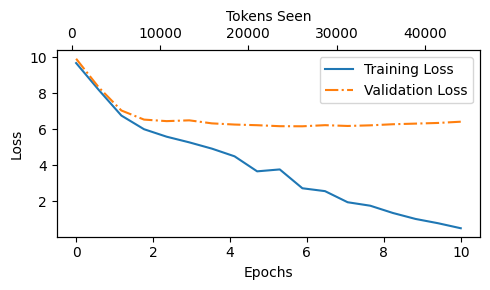

In [216]:
from matplotlib.ticker import  MaxNLocator

def plot_losses(epoch_seen,tokens_seen,train_losses,val_losses):
    fig,ax1 = plt.subplots(figsize=(5,3))

    ax1.plot(epoch_seen,train_losses,label='Training Loss')
    ax1.plot(epoch_seen,val_losses,linestyle="-.",label='Validation Loss')
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Loss")
    ax1.legend(loc='upper right')
    ax1.xaxis.set_major_locator(MaxNLocator(integer = True))

    ax2 = ax1.twiny()
    ax2.plot(tokens_seen,train_losses,alpha=0)
    ax2.set_xlabel("Tokens Seen")

    fig.tight_layout()
    plt.savefig('loss_plot.pdf')
    plt.show()

epoch_tensor = torch.linspace(0,num_epochs,len(train_losses))
plot_losses(epoch_tensor,tokens_seen,train_losses,val_losses)

In [217]:
token_ids = generate_text_simple(
    model=model,
    idx=text_to_toke_ids("Every effort moves you",tokenizer=tokenizer),
    max_new_tokens=25,
    context_size=GPT_CONFIG_124M['context_length']
)
print(token_ids_to_text(token_ids,tokenizer))

Every effort moves you?"
Every effort moves you?"

Every effort moves you?"


Every effort moves you?"

"
Every effort moves you?"

"Yes
Every effort moves you?"

"Yes--
Every effort moves you?"

"Yes--quite
Every effort moves you?"

"Yes--quite ins
Every effort moves you?"

"Yes--quite insensible
Every effort moves you?"

"Yes--quite insensible to
Every effort moves you?"

"Yes--quite insensible to the
Every effort moves you?"

"Yes--quite insensible to the irony
Every effort moves you?"

"Yes--quite insensible to the irony.
Every effort moves you?"

"Yes--quite insensible to the irony. She
Every effort moves you?"

"Yes--quite insensible to the irony. She wanted
Every effort moves you?"

"Yes--quite insensible to the irony. She wanted him
Every effort moves you?"

"Yes--quite insensible to the irony. She wanted him vind
Every effort moves you?"

"Yes--quite insensible to the irony. She wanted him vindicated
Every effort moves you?"

"Yes--quite insensible to the irony. She wanted him

The loss shown above shows the model is overfitted and it memorizes the training data. We can derive that cause validation loss remains constant after second epoch.

Model is overfitting on data cause the size of data is very small. we can overcome this problem by increasing the size of data for training.

# Strategies to overcome model overfitting in our case

Until now the generated tokens is selected corresponding to the longest probability score among all tokens in the vocabulary leads to a lot of randomness and diversity and generated text.

There Are Two technique to control randomness
1. Temperature Scaling
2. Top K Sampling

***Temperature Scalling***

In temperature scaling we replace the argmax with probaility scores.

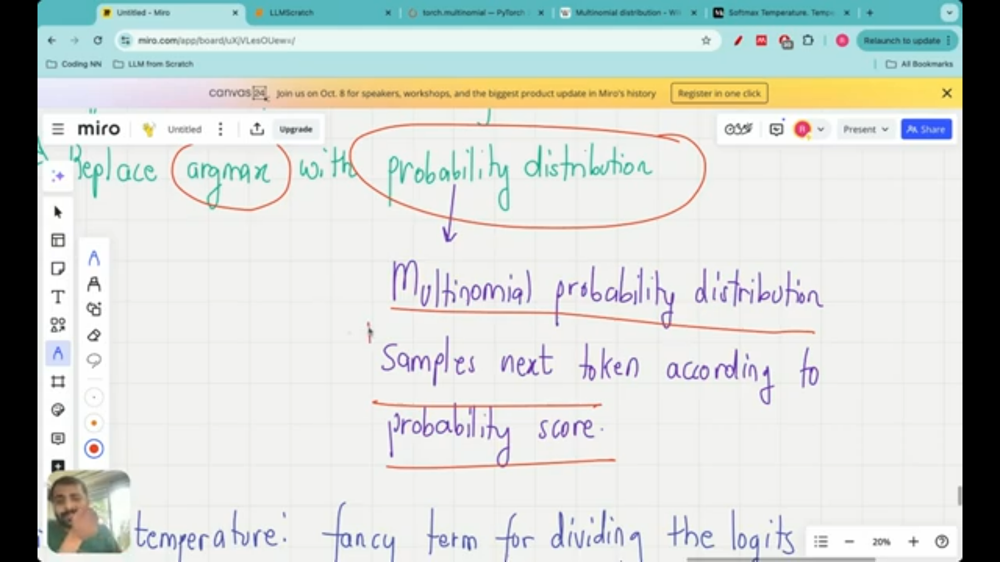

Temperature is just a fancy term for dividing the logits with number greater than 0

In [218]:
vocab = {
    'closer':0,
    "every":1,
    "effort":2,
    'forward':3,
    'inches':4,
    'moves':5,
    'pizza':6,
    'towards':7,
    'you':8
}

In [219]:
inverse_vocab = {v:k for k,v in vocab.items()}

In [220]:
next_token_logits = torch.tensor(
    [4.51,0.89,-1.90,6.75,1.63,-1.62,-1.89,6.28,1.79]
)

In [221]:
probs = torch.softmax(next_token_logits,dim=0)
print(probs)

tensor([    0.0609,     0.0016,     0.0001,     0.5721,     0.0034,     0.0001,
            0.0001,     0.3576,     0.0040])


In [222]:
next_token_id = torch.argmax(probs).item()
print(next_token_id)
print(inverse_vocab[next_token_id])

3
forward


In [223]:
torch.manual_seed(123)
next_token_id = torch.multinomial(probs,num_samples=1).item()
print(inverse_vocab[next_token_id])

forward


In [224]:
def print_sampled_tokens(probs):
    torch.manual_seed(123)
    sample = [torch.multinomial(probs,num_samples=1).item() for i in range(1000)]
    sample_ids = torch.bincount(torch.tensor(sample))
    for i,freq in enumerate(sample_ids):
        print(f"{freq} x {inverse_vocab[i]}")

print_sampled_tokens(probs)

73 x closer
0 x every
0 x effort
582 x forward
2 x inches
0 x moves
0 x pizza
343 x towards


In [225]:
def softmax_with_temperature(logits,temperature):
    scaled_logits = logits/temperature
    return torch.softmax(scaled_logits,dim=0)

temperatures = [1,0.1,5]
scaled_probs = [softmax_with_temperature(next_token_logits,T) for T in temperatures]

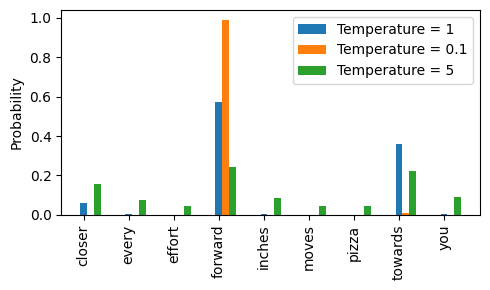

In [226]:
x = torch.arange(len(vocab))
bar_width = 0.15

fig,ax = plt.subplots(figsize=(5,3))
for i,T in enumerate(temperatures):
    rects = ax.bar(x+i*bar_width,scaled_probs[i],bar_width,label=f'Temperature = {T}')

ax.set_ylabel('Probability')
ax.set_xticks(x)
ax.set_xticklabels(vocab.keys(),rotation=90)
ax.legend()

plt.tight_layout()
plt.show()

2. Top K Sampling

In top k sampling we will only consider top k probabilities of token's and replace other probabilities with -inf and then we will apply softmax function over it to get the possible outcome.

In [227]:
top_k = 3
top_logits, top_pos = torch.topk(next_token_logits,top_k)
print(top_logits)
print(top_pos) 

tensor([6.7500, 6.2800, 4.5100])
tensor([3, 7, 0])


In [228]:
new_logits = torch.where(
    condition=next_token_logits < top_logits[-1],
    input=torch.tensor(float('-inf')),
    other=next_token_logits
)
print(new_logits)

tensor([4.5100,   -inf,   -inf, 6.7500,   -inf,   -inf,   -inf, 6.2800,   -inf])


In [229]:
top_k_probs = torch.softmax(new_logits,dim=0)
print(top_k_probs)

tensor([0.0615, 0.0000, 0.0000, 0.5775, 0.0000, 0.0000, 0.0000, 0.3610, 0.0000])


# Merge TopK and Temperature

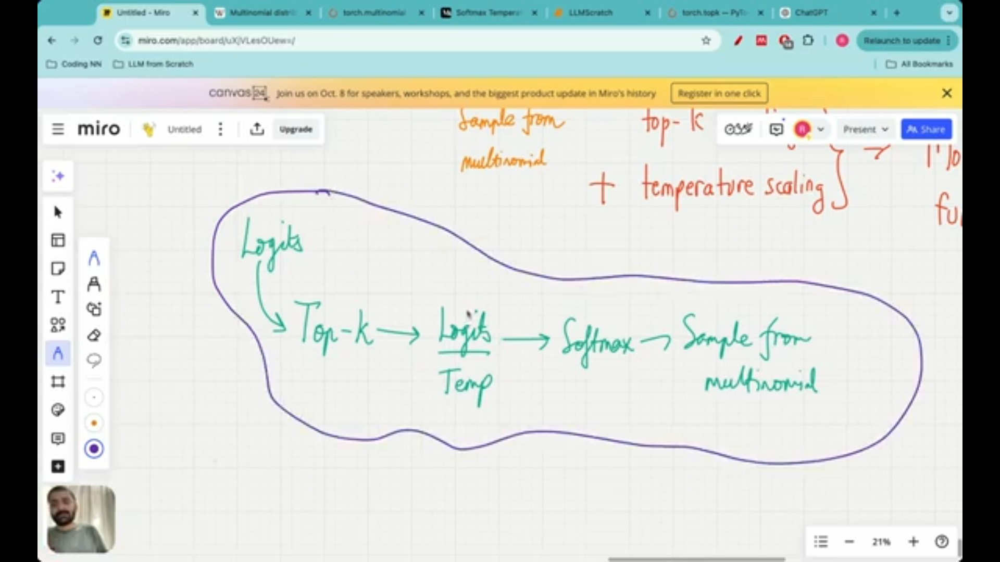

In [230]:
def generate(model,idx,max_new_tokens,context_size,temperature = 0.0,top_k=None,eos_id=None):
    for _ in range(max_new_tokens):
        idx_cond = idx[:,-context_size:]
        with torch.no_grad():
            logits = model(idx_cond)
        logits = logits[:,-1,:]

        if top_k is not None:
            top_logits,_ = torch.topk(logits,top_k)
            min_val = top_logits[:,-1]
            logits = torch.where(logits<min_val,torch.tensor(float('-inf')).to(logits.device),logits)
        
        if temperature > 0.0:
            logits = logits / temperature

            probs = torch.softmax(logits,dim=-1)

            idx_next = torch.multinomial(probs,num_samples=1)
        else:
            idx_next = torch.argmax(logits,dim=-1,keepdim=True)
        if idx_next == eos_id:
            break
        
        idx = torch.cat((idx,idx_next),dim=1)
    
    return idx

In [231]:
torch.manual_seed(123)
token_ids = generate(
    model=model,
    idx=text_to_toke_ids("Every effort moves you",tokenizer),
    max_new_tokens=15,
    context_size=GPT_CONFIG_124M['context_length'],
    top_k=25,
    temperature=1.4
)
print("Output Text:",token_ids_to_text(token_ids,tokenizer))

Output Text: Every effort moves you in the inevitable garlanded. For!"



Well his


# Loading and Saving Torch Model Weights

In [232]:
torch.save({
    'model_state_dict':model.state_dict(),
    'optimizer_state_dict':optimizer.state_dict()
},
"model_and_optimizer.pth")

In [233]:
checkpoint = torch.load('model_and_optimizer.pth')
model = GPTModel(GPT_CONFIG_124M)
model.load_state_dict(checkpoint['model_state_dict'])
optimizer = torch.optim.AdamW(model.parameters(),lr=5e-4,weight_decay=0.1)
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

# Loading Pretrained Weights from OPENAI

In [234]:
import tensorflow as tf 
import tqdm

print(tf.__version__)
print(tqdm.__version__)

2.19.0
4.67.1


In [235]:
from gpt_download3 import download_and_load_gpt2

In [236]:
settings, params = download_and_load_gpt2(model_size="124M",model_dir='gpt2')

Error downloading file: HTTPSConnectionPool(host='openaipublic.core.blob.core.windows.net', port=443): Max retries exceeded with url: /gpt-2/models%5C124M%5Ccheckpoint (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x000001C62FB68170>: Failed to resolve 'openaipublic.core.blob.core.windows.net' ([Errno 11001] getaddrinfo failed)"))
Please check url: https://openaipublic.core.blob.core.windows.net/gpt-2/models\124M\checkpoint
Error downloading file: HTTPSConnectionPool(host='openaipublic.core.blob.core.windows.net', port=443): Max retries exceeded with url: /gpt-2/models%5C124M%5Cencoder.json (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x000001C6318F80B0>: Failed to resolve 'openaipublic.core.blob.core.windows.net' ([Errno 11001] getaddrinfo failed)"))
Please check url: https://openaipublic.core.blob.core.windows.net/gpt-2/models\124M\encoder.json
Error downloading file: HTTPSConnectionPool(host='openaipublic.core.blob.cor

In [237]:
print("Settings:",settings)
print("Parameter Dictionary keys:",params.keys())

Settings: {'n_vocab': 50257, 'n_ctx': 1024, 'n_embd': 768, 'n_head': 12, 'n_layer': 12}
Parameter Dictionary keys: dict_keys(['blocks', 'b', 'g', 'wpe', 'wte'])


In [238]:
print(params['wte'])
print(params['wte'].shape)

[[-0.11010301 -0.03926672  0.03310751 ... -0.1363697   0.01506208
   0.04531523]
 [ 0.04034033 -0.04861503  0.04624869 ...  0.08605453  0.00253983
   0.04318958]
 [-0.12746179  0.04793796  0.18410145 ...  0.08991534 -0.12972379
  -0.08785918]
 ...
 [-0.04453601 -0.05483596  0.01225674 ...  0.10435229  0.09783269
  -0.06952604]
 [ 0.1860082   0.01665728  0.04611587 ... -0.09625227  0.07847701
  -0.02245961]
 [ 0.05135201 -0.02768905  0.0499369  ...  0.00704835  0.15519823
   0.12067825]]
(50257, 768)


In [239]:
NEW_CONFIG = GPT_CONFIG_124M.copy()
NEW_CONFIG.update({"context_length":1024,"qkv_bias":True})

In [240]:
gpt = GPTModel(NEW_CONFIG)
gpt.eval()

GPTModel(
  (tok_emb): Embedding(50257, 768)
  (pos_emb): Embedding(1024, 768)
  (drop_emb): Dropout(p=0.1, inplace=False)
  (trf_block): Sequential(
    (0): TransformerBlock(
      (attn): MultiHeadAttention(
        (w_query): Linear(in_features=768, out_features=768, bias=True)
        (w_key): Linear(in_features=768, out_features=768, bias=True)
        (w_value): Linear(in_features=768, out_features=768, bias=True)
        (out_proj): Linear(in_features=768, out_features=768, bias=True)
        (dropout): Dropout(p=0.1, inplace=False)
      )
      (ff): FeedForwardNetwork(
        (layers): Sequential(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU()
          (2): Linear(in_features=3072, out_features=768, bias=True)
        )
      )
      (norm1): LayerNormalization()
      (norm2): LayerNormalization()
      (drop_shortcut): Dropout(p=0.1, inplace=False)
    )
    (1): TransformerBlock(
      (attn): MultiHeadAttention(
        (w_qu

In [241]:
def assign(left,right):
    if left.shape != right.shape:
        raise ValueError(f"Shape mismatched. Left: {left.shape}, Right: {right.shape}")
    return torch.nn.Parameter(torch.tensor(right))

In [242]:
# this function loads the weights from open ai community to our custom model.
def load_weights_into_gpt(gpt,params):

    gpt.pos_emb.weight = assign(gpt.pos_emb.weight,params['wpe'])
    gpt.tok_emb.weight = assign(gpt.tok_emb.weight,params['wte'])

    for b in range(len(params['blocks'])):
        q_w,k_w,v_w = np.split(
            (params['blocks'][b]['attn']['c_attn'])['w'],3,axis=-1)
        gpt.trf_block[b].attn.w_query.weight = assign(gpt.trf_block[b].attn.w_query.weight,q_w.T)
        gpt.trf_block[b].attn.w_key.weight = assign(gpt.trf_block[b].attn.w_key.weight,k_w.T)
        gpt.trf_block[b].attn.w_value.weight = assign(gpt.trf_block[b].attn.w_value.weight,v_w.T)

        q_b, k_b, v_b = np.split(
            (params['blocks'][b]['attn']['c_attn'])['b'],3,axis=-1)
        gpt.trf_block[b].attn.w_query.bias = assign(gpt.trf_block[b].attn.w_query.bias,q_b)
        gpt.trf_block[b].attn.w_key.bias = assign(gpt.trf_block[b].attn.w_key.bias,k_b)
        gpt.trf_block[b].attn.w_value.bias = assign(gpt.trf_block[b].attn.w_value.bias,v_b)

        gpt.trf_block[b].attn.out_proj.weight = assign(gpt.trf_block[b].attn.out_proj.weight,
                                                        params['blocks'][b]['attn']['c_proj']['w'].T)
        gpt.trf_block[b].attn.out_proj.bias = assign(gpt.trf_block[b].attn.out_proj.bias,
                                                      params['blocks'][b]['attn']['c_proj']['b'])
        
        gpt.trf_block[b].ff.layers[0].weight = assign(gpt.trf_block[b].ff.layers[0].weight,
                                                       params['blocks'][b]['mlp']['c_fc']['w'].T)
        gpt.trf_block[b].ff.layers[0].bias = assign(gpt.trf_block[b].ff.layers[0].bias,
                                                     params['blocks'][b]['mlp']['c_fc']['b'])
        
        gpt.trf_block[b].ff.layers[2].weight = assign(gpt.trf_block[b].ff.layers[2].weight,
                                                       params['blocks'][b]['mlp']['c_proj']['w'].T)
        gpt.trf_block[b].ff.layers[2].bias = assign(gpt.trf_block[b].ff.layers[2].bias,
                                                     params['blocks'][b]['mlp']['c_proj']['b'])
        
        gpt.trf_block[b].norm1.scale = assign(gpt.trf_block[b].norm1.scale,
                                               params['blocks'][b]['ln_1']['g'])
        gpt.trf_block[b].norm1.shift = assign(gpt.trf_block[b].norm1.shift,
                                               params['blocks'][b]['ln_1']['b'])
        gpt.trf_block[b].norm2.scale = assign(gpt.trf_block[b].norm2.scale,
                                               params['blocks'][b]['ln_2']['g'])
        gpt.trf_block[b].norm2.shift = assign(gpt.trf_block[b].norm2.shift,
                                               params['blocks'][b]['ln_2']['b'])

        gpt.final_norm.scale = assign(gpt.final_norm.scale,params['g'])
        gpt.final_norm.shift = assign(gpt.final_norm.shift,params['b'])
        gpt.out_head.weight = assign(gpt.out_head.weight,params['wte'])

In [243]:
load_weights_into_gpt(gpt,params)
gpt.to(device)

GPTModel(
  (tok_emb): Embedding(50257, 768)
  (pos_emb): Embedding(1024, 768)
  (drop_emb): Dropout(p=0.1, inplace=False)
  (trf_block): Sequential(
    (0): TransformerBlock(
      (attn): MultiHeadAttention(
        (w_query): Linear(in_features=768, out_features=768, bias=True)
        (w_key): Linear(in_features=768, out_features=768, bias=True)
        (w_value): Linear(in_features=768, out_features=768, bias=True)
        (out_proj): Linear(in_features=768, out_features=768, bias=True)
        (dropout): Dropout(p=0.1, inplace=False)
      )
      (ff): FeedForwardNetwork(
        (layers): Sequential(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU()
          (2): Linear(in_features=3072, out_features=768, bias=True)
        )
      )
      (norm1): LayerNormalization()
      (norm2): LayerNormalization()
      (drop_shortcut): Dropout(p=0.1, inplace=False)
    )
    (1): TransformerBlock(
      (attn): MultiHeadAttention(
        (w_qu

In [244]:
torch.manual_seed(123)
token_ids = generate(
    model=gpt,
    idx = text_to_toke_ids('Every effort moves you',tokenizer).to(device),
    max_new_tokens=25,
    context_size=NEW_CONFIG['context_length'],
    top_k=50,
    temperature=1.5
)
print("Output text:\n",token_ids_to_text(token_ids,tokenizer))

Output text:
 Every effort moves you toward finding an ideal new way to practice something!

What makes us want to be on top of that?




# LLM Finetuning

Finetuning of model includes again training pre trained model on domain specific dataset to perform good at the same domain.

1. Instruction Finetuning - We train a model on the set of task using specific instruction. It can handel broader set of tasks. to do this larger dataset and greater computational power is needed.
2. Classification Finetuning - It is used to classify between data for classification such as cat/dog or spam/ham.

PEFT is a form of Instruction finetuning.In this we finetune only certain weights instead of whole model. This method is memory efficient and is better way to perform finetuning. It has two methods LORA and QLORA.

# Finetuning for Classification

In [245]:
import pandas as pd 

data_path  = 'sms_spam_collection/SMSSpamCollection'
df = pd.read_csv(data_path,header=None,sep='\t',names=['Label','Text'])
df

,Label,Text
0,ham,"Go until jurong point, crazy.. Available only ..."
1,ham,Ok lar... Joking wif u oni...
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...
3,ham,U dun say so early hor... U c already then say...
4,ham,"Nah I don't think he goes to usf, he lives aro..."
...,...,...
5567,spam,This is the 2nd time we have tried 2 contact u...
5568,ham,Will ü b going to esplanade fr home?
5569,ham,"Pity, * was in mood for that. So...any other s..."
5570,ham,The guy did some bitching but I acted like i'd...


In [246]:
print(df['Label'].value_counts())

Label
ham     4825
spam     747
Name: count, dtype: int64


In [247]:
def create_balanced_dataset(df):
    num_spam = df[df['Label'] == 'spam'].shape[0]
    ham_subset = df[df['Label'] == 'ham'].sample(num_spam,random_state=123)

    balanced_df = pd.concat([ham_subset,df[df['Label'] == 'spam']])

    return balanced_df

balanced_df = create_balanced_dataset(df)
balanced_df['Label'].value_counts()

Label
ham     747
spam    747
Name: count, dtype: int64

In [248]:
balanced_df['Label'] = balanced_df['Label'].map({"ham":0,'spam':1})

In [249]:
balanced_df


,Label,Text
4307,0,Awww dat is sweet! We can think of something t...
4138,0,Just got to &lt;#&gt;
4831,0,"The word ""Checkmate"" in chess comes from the P..."
4461,0,This is wishing you a great day. Moji told me ...
5440,0,Thank you. do you generally date the brothas?
...,...,...
5537,1,Want explicit SEX in 30 secs? Ring 02073162414...
5540,1,ASKED 3MOBILE IF 0870 CHATLINES INCLU IN FREE ...
5547,1,Had your contract mobile 11 Mnths? Latest Moto...
5566,1,REMINDER FROM O2: To get 2.50 pounds free call...


In [250]:
def random_split(df,train_frac,validation_frac):
    df = df.sample(frac=1,random_state=123).reset_index(drop=True)

    train_end = int(len(df) * train_frac)
    validation_end = train_end + int(len(df)*validation_frac)

    train_df = df[:train_end]
    validation_df = df[train_end:validation_end]
    test_df = df[validation_end:]

    return train_df,validation_df,test_df

train_df,validation_df,test_df = random_split(balanced_df,0.7,0.1)

In [251]:
print(len(train_df))
print(len(validation_df))
print(len(test_df))
print(len(train_df)+len(test_df)+len(validation_df))

1045
149
300
1494


In [252]:
train_df.to_csv('train.csv',index=None)
validation_df.to_csv('validation.csv',index=None)
test_df.to_csv('test.csv',index=None)

Creating Dataloaders

In [253]:
class SpamDataset(Dataset):
    def __init__(self,csv_file,tokenizer,max_length=None,pad_token_id=50256):
        super().__init__()
        self.data = pd.read_csv(csv_file)

        self.encoded_texts = [tokenizer.encode(text) for text in self.data['Text']]

        if max_length is None:
            self.max_length = self._longest_encoded_length()
        else:
            self.max_length = max_length

            self.encoded_texts = [encoded_text[:self.max_length] for encoded_text in self.encoded_texts]

        # pad sequences to the longest sequence
        self.encoded_texts = [encoded_text + [pad_token_id] * (self.max_length - len(encoded_text)) for encoded_text in self.encoded_texts]

    def __getitem__(self, index):
        encoded = self.encoded_texts[index]
        label = self.data.iloc[index]["Label"]
        return (
            torch.tensor(encoded,dtype=torch.long),
            torch.tensor(label,dtype=torch.long)
        )
    
    def __len__(self):
        return len(self.data)
    
    def _longest_encoded_length(self):
        max_length = 0
        for encoded_text in self.encoded_texts:
            encoded_length = len(encoded_text)
            if encoded_length > max_length:
                max_length = encoded_length
        return max_length

In [254]:
train_dataset = SpamDataset(csv_file='train.csv',max_length=None,tokenizer=tokenizer)
validation_dataset = SpamDataset(csv_file='validation.csv',max_length=None,tokenizer=tokenizer)
test_dataset = SpamDataset(csv_file='test.csv',max_length=None,tokenizer=tokenizer)

In [255]:
print(train_dataset.data.shape)
print(validation_dataset.data.shape)
print(test_dataset.data.shape)

(1045, 2)
(149, 2)
(300, 2)


In [256]:
num_workers = 0
batch_size = 8

train_loader = DataLoader(
    dataset=train_dataset,
    batch_size=batch_size,
    num_workers=num_workers,
    shuffle=True,
    drop_last=True
)

validation_loader = DataLoader(
    dataset=validation_dataset,
    num_workers=num_workers,
    batch_size=batch_size,
    drop_last=False
)

test_loader = DataLoader(
    dataset=test_dataset,
    num_workers=num_workers,
    batch_size=batch_size,
    drop_last=False
)

In [257]:
for input_batch,target_batch in train_loader:
    pass
print("Input Dimention",input_batch.shape)
print("Target Dimention",target_batch.shape)

Input Dimention torch.Size([8, 120])
Target Dimention torch.Size([8])


In [258]:
print(len(train_loader))
print(len(validation_loader))
print(len(test_loader))

130
19
38


Initializing model with pretrained weights.

In [259]:
CHOOSE_MODEL = 'gpt2-small (124M)'
INPUT_PROMPT = 'Every effort moves'

BASE_CONFIG = {
    "vocab_size":50257,
    "context_length":1024,
    "drop_rate":0.0,
    "qkv_bias":True
}

model_configs = {
    'gpt2-small (124M)' : {"emb_dim":768,"n_layers":12,"n_heads":12},
    'gpt2-medium (355M)' : {"emb_dim":1024,"n_layers":24,"n_heads":16},
    'gpt2-large (774M)' : {"emb_dim":1280,"n_layers":36,"n_heads":20},
    'gpt2-xl (1558M)' : {"emb_dim":1600,"n_layers":48,"n_heads":25},
}

BASE_CONFIG.update(model_configs[CHOOSE_MODEL])

assert train_dataset.max_length <= BASE_CONFIG['context_length'],(
    f"Dataset Length {train_dataset.max_length} exceeds model's context"
    f"length {BASE_CONFIG['context_length']}. Reinitialize dataset with"
    f"max_length={BASE_CONFIG['context_length']}"
)

In [260]:
model_size = CHOOSE_MODEL.split(' ')[-1].lstrip("(").rstrip(")")

from gpt_download3 import download_and_load_gpt2

settings,params = download_and_load_gpt2(model_size=model_size,model_dir='gpt2')

model = GPTModel(BASE_CONFIG)
load_weights_into_gpt(model,params)
model.eval()

Error downloading file: HTTPSConnectionPool(host='openaipublic.core.blob.core.windows.net', port=443): Max retries exceeded with url: /gpt-2/models%5C124M%5Ccheckpoint (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x000001C6550D0170>: Failed to resolve 'openaipublic.core.blob.core.windows.net' ([Errno 11001] getaddrinfo failed)"))
Please check url: https://openaipublic.core.blob.core.windows.net/gpt-2/models\124M\checkpoint
Error downloading file: HTTPSConnectionPool(host='openaipublic.core.blob.core.windows.net', port=443): Max retries exceeded with url: /gpt-2/models%5C124M%5Cencoder.json (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x000001C6550D0830>: Failed to resolve 'openaipublic.core.blob.core.windows.net' ([Errno 11001] getaddrinfo failed)"))
Please check url: https://openaipublic.core.blob.core.windows.net/gpt-2/models\124M\encoder.json
Error downloading file: HTTPSConnectionPool(host='openaipublic.core.blob.cor

GPTModel(
  (tok_emb): Embedding(50257, 768)
  (pos_emb): Embedding(1024, 768)
  (drop_emb): Dropout(p=0.0, inplace=False)
  (trf_block): Sequential(
    (0): TransformerBlock(
      (attn): MultiHeadAttention(
        (w_query): Linear(in_features=768, out_features=768, bias=True)
        (w_key): Linear(in_features=768, out_features=768, bias=True)
        (w_value): Linear(in_features=768, out_features=768, bias=True)
        (out_proj): Linear(in_features=768, out_features=768, bias=True)
        (dropout): Dropout(p=0.0, inplace=False)
      )
      (ff): FeedForwardNetwork(
        (layers): Sequential(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU()
          (2): Linear(in_features=3072, out_features=768, bias=True)
        )
      )
      (norm1): LayerNormalization()
      (norm2): LayerNormalization()
      (drop_shortcut): Dropout(p=0.0, inplace=False)
    )
    (1): TransformerBlock(
      (attn): MultiHeadAttention(
        (w_qu

In [261]:
text1 = (
    "Is the following text 'spam'? Answer with 'yes' or 'no':"
    " 'You are a winner you have been specially"
    " selected to receive $1000 cash or a $2000 award.'"
)
token_ids = generate(
    model=model,
    idx=text_to_toke_ids(text1,tokenizer),
    max_new_tokens=23,
    context_size=BASE_CONFIG['context_length'],
)

print(token_ids_to_text(token_ids,tokenizer))

Is the following text 'spam'? Answer with 'yes' or 'no': 'You are a winner you have been specially selected to receive $1000 cash or a $2000 award.'

The following text 'spam'? Answer with 'yes' or 'no': 'You are a winner


Adding a classification Head.

In [262]:
print(model)

GPTModel(
  (tok_emb): Embedding(50257, 768)
  (pos_emb): Embedding(1024, 768)
  (drop_emb): Dropout(p=0.0, inplace=False)
  (trf_block): Sequential(
    (0): TransformerBlock(
      (attn): MultiHeadAttention(
        (w_query): Linear(in_features=768, out_features=768, bias=True)
        (w_key): Linear(in_features=768, out_features=768, bias=True)
        (w_value): Linear(in_features=768, out_features=768, bias=True)
        (out_proj): Linear(in_features=768, out_features=768, bias=True)
        (dropout): Dropout(p=0.0, inplace=False)
      )
      (ff): FeedForwardNetwork(
        (layers): Sequential(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU()
          (2): Linear(in_features=3072, out_features=768, bias=True)
        )
      )
      (norm1): LayerNormalization()
      (norm2): LayerNormalization()
      (drop_shortcut): Dropout(p=0.0, inplace=False)
    )
    (1): TransformerBlock(
      (attn): MultiHeadAttention(
        (w_qu

Here we have 12 transformer blocks and output lyae gives output features which are 50257, To finetune this we have to chage the model's output layer as we need it for binary classification task

to do this we will first freeze the model(we will make all the layer non trainable)

We will finetune:
1. final output head
2. final transformer block
3. final layernormaization module

In [263]:
# freezing the model
for param in model.parameters():
    param.requires_grad = False

In [264]:
torch.manual_seed(123)
num_classes = 2
model.out_head = torch.nn.Linear(in_features=BASE_CONFIG['emb_dim'],out_features=num_classes)

In [265]:
for param in model.trf_block[-1].parameters():
    param.requires_grad = True

for param in model.final_norm.parameters():
    param.requires_grad = True

In [266]:
inputs = tokenizer.encode("Do you have time")
inputs = torch.tensor(inputs).unsqueeze(0)
print("Inputs")
print("Input Dimentions:",inputs.shape)

Inputs
Input Dimentions: torch.Size([1, 4])


In [267]:
with torch.no_grad():
    output = model(inputs)

print("Outputs:\n",output)
print("Outputs Dimention:",output.shape)

Outputs:
 tensor([[[-1.5854,  0.9904],
         [-3.7235,  7.4548],
         [-2.2661,  6.6049],
         [-3.5983,  3.9902]]])
Outputs Dimention: torch.Size([1, 4, 2])


In [268]:
print("Last output token:",output[:,-1,:])

Last output token: tensor([[-3.5983,  3.9902]])


Calculating the classification loss and accuracy.

In [269]:
probs = torch.softmax(output[:,-1,:],dim=-1)
print(probs)
label = torch.argmax(probs)
print("Classification Label:",label.item())

tensor([[    0.0005,     0.9995]])
Classification Label: 1


In [270]:
def calc_accuracy_loader(data_loader,model,device,num_batches=None):
    model.eval()
    correct_predictions,num_examples = 0,0

    if num_batches is None:
        num_batches = len(data_loader)
    else:
        num_batches = min(num_batches,len(data_loader))
    for i, (input_batch,target_batch) in enumerate(data_loader):
        if i < num_batches:
            input_batch,target_batch = input_batch.to(device), target_batch.to(device)

            with torch.no_grad():
                logits = model(input_batch)[:,-1,:]
            # probs = torch.softmax(logits,dim=-1)
            predicted_labels = torch.argmax(logits,dim=-1)

            num_examples += predicted_labels.shape[0]
            correct_predictions += (predicted_labels == target_batch).sum().item()
        else:
            break
        
    return correct_predictions / num_examples

In [271]:
model.to(device)
torch.manual_seed(123)

train_accuracy = calc_accuracy_loader(data_loader=train_loader,model=model,device=device,num_batches=10)
validation_accuracy = calc_accuracy_loader(validation_loader,model,device,num_batches=10)
test_accuracy = calc_accuracy_loader(test_loader,model,device,num_batches=10)

print("Training Accuracy:",train_accuracy*100)
print("Validation Accuracy:",validation_accuracy*100)
print("Test Accuracy:",test_accuracy*100)

Training Accuracy: 46.25
Validation Accuracy: 45.0
Test Accuracy: 48.75


We will use cross entropy loss to calculate loss

In [272]:
def calc_loss_batch(input_batch,target_batch,model,device):
    input_batch,target_batch = input_batch.to(device),target_batch.to(device)
    logits = model(input_batch)[:,-1,:]
    loss = torch.nn.functional.cross_entropy(logits,target_batch)
    return loss

In [273]:
def calc_loss_loader(data_loader,model,device,num_batches=None):
    total_loss =0
    if len(data_loader) == 0:
        return float('nan')
    elif num_batches is None:
        num_batches = len(data_loader)
    else:
        num_batches = min(num_batches,len(data_loader))
    
    for i, (input_batch,target_batch) in enumerate(data_loader):
        if i <num_batches:
            loss = calc_loss_batch(input_batch,target_batch,model,device)
            total_loss += loss.item()
        else:
            break
    return total_loss/num_batches

In [274]:
with torch.no_grad():
    train_loss = calc_loss_loader(train_loader,model,device,num_batches=5)
    val_loss = calc_loss_loader(validation_loader,model,device,num_batches=5)
    test_loss = calc_loss_loader(test_loader,model,device,num_batches=5)

print(f"Training Loss: {train_loss:.3f}")
print(f"Validation Loss: {val_loss:.3f}")
print(f"Testing Loss: {test_loss:.3f}")

Training Loss: 2.453
Validation Loss: 2.525
Testing Loss: 2.413


Finetuning Model on Superwised data.

In [275]:
def train_classifier_simple(model,train_loader,val_loader,optimizer,device,num_epochs,eval_freq,eval_iter):
    train_losses,val_losses,train_accs,val_accs = [],[],[],[]
    examples_seen,global_step = 0,-1 
    
    for epoch in range(num_epochs):
        model.train()

        for input_batch,target_batch in train_loader:
            optimizer.zero_grad()
            loss = calc_loss_batch(input_batch,target_batch,model,device)
            loss.backward()
            optimizer.step()
            examples_seen += input_batch.shape[0]
            global_step += 1
        
            if global_step % eval_freq == 0:
                train_loss,val_loss = evaluate_model(model,train_loader,val_loader,device,eval_iter)
                train_losses.append(train_loss)
                val_losses.append(val_loss)
            
        print(f"EP {epoch+1} (Step {global_step:06d}):"
                  f"Train Loss: {train_loss:.3f}, Val Loss: {val_loss:.3f}")
        
        train_accuracy = calc_accuracy_loader(train_loader,model,device,num_batches=eval_iter)
        val_accuracy = calc_accuracy_loader(val_loader,model,device,num_batches=eval_iter)

        print(f"Training Accuracy: {train_accuracy*100:.2f}")
        print(f"Validation Accuracy: {val_accuracy*100:.2f}")
        train_accs.append(train_accuracy)
        val_accs.append(val_accuracy)
    
    return train_losses,val_losses,train_accs,val_accs,examples_seen

In [276]:
def evaluate_model(model,train_loader,val_loader,device,eval_iter):
    model.eval()
    with torch.no_grad():
        train_loss = calc_loss_loader(train_loader,model,device,num_batches=eval_iter)
        val_loss = calc_loss_loader(val_loader,model,device,num_batches=eval_iter)
    model.train()
    return train_loss, val_loss

In [277]:
start_time = time.time()

torch.manual_seed(123)

optimizer = torch.optim.AdamW(model.parameters(),lr=5e-5,weight_decay=0.1)

num_epochs = 5
train_losses,val_losses,train_accs,val_accs,example_seen = train_classifier_simple(
    model,train_loader,validation_loader,optimizer,device,num_epochs,eval_freq=50,eval_iter=5
)

end_time = time.time()
execution_time_minutes = (end_time-start_time) /60
print(f"Training completed in {execution_time_minutes}")

EP 1 (Step 000129):Train Loss: 0.523, Val Loss: 0.602
Training Accuracy: 70.00
Validation Accuracy: 82.50
EP 2 (Step 000259):Train Loss: 0.409, Val Loss: 0.520
Training Accuracy: 82.50
Validation Accuracy: 72.50
EP 3 (Step 000389):Train Loss: 0.340, Val Loss: 0.426
Training Accuracy: 90.00
Validation Accuracy: 82.50
EP 4 (Step 000519):Train Loss: 0.222, Val Loss: 0.249
Training Accuracy: 100.00
Validation Accuracy: 90.00
EP 5 (Step 000649):Train Loss: 0.083, Val Loss: 0.133
Training Accuracy: 100.00
Validation Accuracy: 97.50
Training completed in 22.18109118938446


In [278]:
def plot_values(epochs_seen,examples_seen,train_values,val_values,label='loss'):
    fig,ax1 = plt.subplots(figsize=(5,3))

    ax1.plot(epochs_seen,train_values,label=f"Training {label}")
    ax1.plot(epochs_seen,val_values,linestyle="-.",label=f"validation {label}")
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel(label.capitalize())
    ax1.legend()

    ax2 = ax1.twiny()
    ax2.plot(examples_seen,train_values,alpha=0)
    ax2.set_xlabel("Examples seen")

    fig.tight_layout()
    plt.show()

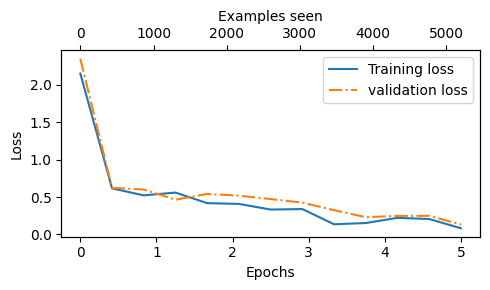

In [279]:
epochs_tensor = torch.linspace(0,num_epochs,len(train_losses))
example_seen_tensor = torch.linspace(0,example_seen,len(train_losses))
plot_values(epochs_tensor,example_seen_tensor,train_losses,val_losses)

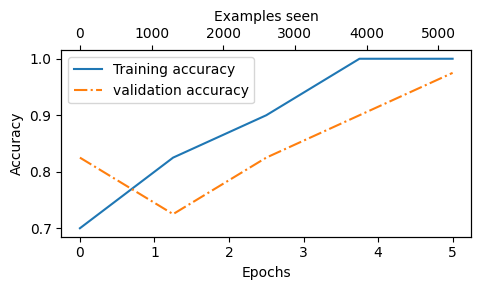

In [280]:
epochs_tensor = torch.linspace(0,num_epochs,len(train_accs))
example_seen_tensor = torch.linspace(0,example_seen,len(train_accs))
plot_values(epochs_tensor,example_seen_tensor,train_accs,val_accs,label='accuracy')

In [281]:
model.to(device)
torch.manual_seed(123)

train_accuracy = calc_accuracy_loader(data_loader=train_loader,model=model,device=device)
validation_accuracy = calc_accuracy_loader(validation_loader,model,device)
test_accuracy = calc_accuracy_loader(test_loader,model,device)

print("Training Accuracy:",train_accuracy*100)
print("Validation Accuracy:",validation_accuracy*100)
print("Test Accuracy:",test_accuracy*100)

Training Accuracy: 97.21153846153847
Validation Accuracy: 95.9731543624161
Test Accuracy: 96.33333333333334


In [282]:
def classify_review(text,model,tokenizer,device,max_length=None,pad_token_id=50256):
    model.eval()
    input_ids = tokenizer.encode(text)
    supported_context_length = model.pos_emb.weight.shape[0]

    input_ids = input_ids[:min(max_length,supported_context_length)]

    input_ids += [pad_token_id] * (max_length - len(input_ids))
    input_tensor = torch.tensor(input_ids,device=device).unsqueeze(0)

    with torch.no_grad():
        logits = model(input_tensor)[:,-1,:]
    predicted_label = torch.argmax(logits,dim=-1).item()

    return "Spam" if predicted_label == 1 else 'Ham'

In [283]:
text = ("You are winner you have been specially"
        " selected to recieve $1000 cash or a $2000 reward.")
print(text)
classify_review(text,model,tokenizer,device,train_dataset.max_length)

You are winner you have been specially selected to recieve $1000 cash or a $2000 reward.


'Spam'

In [284]:
text = ("Hey, just wanted to check if we're still on"
        " for dinner tonight? let me know!")
print(text)
classify_review(text,model,tokenizer,device,train_dataset.max_length)

Hey, just wanted to check if we're still on for dinner tonight? let me know!


'Ham'

# Instruction Finetuning

To do this project we will build our own personal assistance.

In [285]:
import json
import urllib
import os
import ssl
import urllib.request

def download_and_load(file_path,url):
    ssl_context = ssl.create_default_context()
    ssl_context.check_hostname = False
    ssl_context.verify_mode = ssl.CERT_NONE

    if not os.path.exists(file_path):
        with urllib.request.urlopen(url,context=ssl_context) as response:
            text_data = response.read().decode("utf-8")
        with open(file_path,'w',encoding='utf-8') as file:
            file.write(text_data)
    else:
        with open(file_path,'r',encoding='utf-8') as file:
            text_data = file.read()
    with open(file_path,'r',encoding='utf-8') as file:
        data = json.load(file)
    
    return data

file_path = 'instruction-data.json'
url = ("https://raw.githubusercontent.com/rasbt/LLMs-from-scratch"
       "/main/ch07/01_main-chapter-code/instruction-data.json")

data = download_and_load(file_path,url)

In [286]:
print(len(data))

1100


In [287]:
data[50]

{'instruction': 'Identify the correct spelling of the following word.',
 'input': 'Ocassion',
 'output': "The correct spelling is 'Occasion.'"}

# Converting Instruction Into ALPACA Format

We have to convert instruction into alpaca or phi3 prompt format to get correct answer.

In [288]:
def format_input(entry):
    instruction_text = (
        f"Below is an instruction that describes a task. "
        f"write a response that appropriately completes the request."
        f"\n\n### Instruction:\n{entry['instruction']}"   
    )

    input_text = f"\n\n### Input:\n{entry['input']}" if entry['input'] else ""

    return instruction_text + input_text

In [289]:
model_input = format_input(data[50])
desired_response = f"\n\n### Response:\n{data[50]['output']}"
print(model_input + desired_response)

Below is an instruction that describes a task. write a response that appropriately completes the request.

### Instruction:
Identify the correct spelling of the following word.

### Input:
Ocassion

### Response:
The correct spelling is 'Occasion.'


# Splitting Dataset into Train Test and Validation

In [290]:
train_proportion = int(len(data)*0.85) # Training
test_proportion = int(len(data)*0.1) # Testing
val_proportion = len(data) - train_proportion - test_proportion # Validation

train_data = data[:train_proportion]
test_data = data[train_proportion:train_proportion+test_proportion]
val_data = data[train_proportion+test_proportion:]

In [291]:
print("Training set length:",len(train_data))
print("Testing set length:",len(test_data))
print("Validation set length:",len(val_data))

Training set length: 935
Testing set length: 110
Validation set length: 55


In [292]:
class InstructionDataset(Dataset):
    def __init__(self,data,tokenizer):
        super().__init__()
        self.data = data

        self.encoded_texts = []
        for entry in data:
            instruction_plus_input = format_input(entry)
            response_text = f"\n\n### Response:\n{entry['output']}"
            full_text = instruction_plus_input + response_text
            self.encoded_texts.append(tokenizer.encode(full_text))
    
    def __getitem__(self, index):
        return self.encoded_texts[index]
    
    def __len__(self):
        return len(self.data)

In [293]:
def custom_collate_draft_1(batch,pad_token_id=50256,device='cpu'):
    batch_max_length = max(len(item)+1 for item in batch)

    inputs_lst = []
    
    for item in batch:
        new_item = item.copy()
        new_item += [pad_token_id]

        padded = (new_item + [pad_token_id] * (batch_max_length - len(new_item)))

        inputs = torch.tensor(padded[:-1])
        inputs_lst.append(inputs)
    
    inputs_tensor = torch.stack(inputs_lst).to(device)

    return inputs_tensor

# Creating target tokenids for Training

In [294]:
def custom_collate_draft_2(batch,pad_token_id=50256,device='cpu'):
    batch_max_length = max(len(item)+1 for item in batch)

    inputs_lst, target_lst = [],[]
    
    for item in batch:
        new_item = item.copy()
        new_item += [pad_token_id]

        padded = (new_item + [pad_token_id] * (batch_max_length - len(new_item)))

        inputs = torch.tensor(padded[:-1])
        targets = torch.tensor(padded[1:])
        inputs_lst.append(inputs)
        target_lst.append(targets)


    inputs_tensor = torch.stack(inputs_lst).to(device)
    targets_tensor = torch.stack(target_lst).to(device)

    return inputs_tensor,targets_tensor

In [295]:
def custom_collate_fn(
    batch,
    pad_token_id=50256,
    ignore_index=-100,
    allowed_max_length=None,
    device="cpu"
):
    # Find the longest sequence in the batch
    batch_max_length = max(len(item)+1 for item in batch)

    # Pad and prepare inputs and targets
    inputs_lst, targets_lst = [], []

    for item in batch:
        new_item = item.copy()
        # Add an <|endoftext|> token
        new_item += [pad_token_id]
        # Pad sequences to max_length
        padded = (
            new_item + [pad_token_id] *
            (batch_max_length - len(new_item))
        )
        inputs = torch.tensor(padded[:-1])  # Truncate the last token for inputs
        targets = torch.tensor(padded[1:])  # Shift +1 to the right for targets

        # New: Replace all but the first padding tokens in targets by ignore_index
        mask = targets == pad_token_id
        indices = torch.nonzero(mask).squeeze()
        if indices.numel() > 1:
            targets[indices[1:]] = ignore_index

        # New: Optionally truncate to maximum sequence length
        if allowed_max_length is not None:
            inputs = inputs[:allowed_max_length]
            targets = targets[:allowed_max_length]

        inputs_lst.append(inputs)
        targets_lst.append(targets)

    # Convert list of inputs and targets to tensors and transfer to target device
    inputs_tensor = torch.stack(inputs_lst).to(device)
    targets_tensor = torch.stack(targets_lst).to(device)

    return inputs_tensor, targets_tensor

# Creating Dataloaders

In [296]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

print("Device:",device)

Device: cpu


In [297]:
from functools import partial
custom_collate_fn = partial(custom_collate_fn,device=device,allowed_max_length=1024)

In [298]:
num_workers = 0
batch_size = 8

torch.manual_seed(123)

train_dataset = InstructionDataset(train_data,tokenizer)
train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    collate_fn=custom_collate_fn,
    shuffle=True,
    drop_last=True,
    num_workers=num_workers
)

val_dataset = InstructionDataset(val_data,tokenizer)
val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    collate_fn=custom_collate_fn,
    shuffle=False,
    drop_last=False,
    num_workers=num_workers
)

test_dataset = InstructionDataset(test_data,tokenizer)
test_loader = DataLoader(
    test_dataset,
    batch_size=batch_size,
    collate_fn=custom_collate_fn,
    shuffle=False,
    drop_last=False,
    num_workers=num_workers
)

In [299]:
print("Train Loader:")
for inputs,targets in train_loader:
    print(inputs.shape,targets.shape)

Train Loader:
torch.Size([8, 61]) torch.Size([8, 61])
torch.Size([8, 76]) torch.Size([8, 76])
torch.Size([8, 73]) torch.Size([8, 73])
torch.Size([8, 68]) torch.Size([8, 68])
torch.Size([8, 65]) torch.Size([8, 65])
torch.Size([8, 72]) torch.Size([8, 72])
torch.Size([8, 80]) torch.Size([8, 80])
torch.Size([8, 67]) torch.Size([8, 67])
torch.Size([8, 62]) torch.Size([8, 62])
torch.Size([8, 75]) torch.Size([8, 75])
torch.Size([8, 62]) torch.Size([8, 62])
torch.Size([8, 68]) torch.Size([8, 68])
torch.Size([8, 67]) torch.Size([8, 67])
torch.Size([8, 77]) torch.Size([8, 77])
torch.Size([8, 69]) torch.Size([8, 69])
torch.Size([8, 79]) torch.Size([8, 79])
torch.Size([8, 71]) torch.Size([8, 71])
torch.Size([8, 66]) torch.Size([8, 66])
torch.Size([8, 83]) torch.Size([8, 83])
torch.Size([8, 68]) torch.Size([8, 68])
torch.Size([8, 80]) torch.Size([8, 80])
torch.Size([8, 71]) torch.Size([8, 71])
torch.Size([8, 69]) torch.Size([8, 69])
torch.Size([8, 65]) torch.Size([8, 65])
torch.Size([8, 68]) torch.

# Loading a pretrained LLM

In [300]:
BASE_CONFIG = {
    'vocab_size':50257,
    'context_length':1024,
    'drop_rate':0.0,
    'qkv_bias':True
}

model_configs = {
    'gpt2-small (124M)' : {"emb_dim":768,"n_layers":12,"n_heads":12},
    'gpt2-medium (355M)' : {"emb_dim":1024,"n_layers":24,"n_heads":16},
    'gpt2-large (774M)' : {"emb_dim":1280,"n_layers":36,"n_heads":20},
    'gpt2-xl (1558M)' : {"emb_dim":1600,"n_layers":48,"n_heads":25},
}

CHOOSE_MODEL = 'gpt2-medium (355M)'

BASE_CONFIG.update(model_configs[CHOOSE_MODEL])

model_size = CHOOSE_MODEL.split(" ")[-1].lstrip("()").rstrip(")")

settings,params = download_and_load_gpt2(model_size,'gpt2')

Error downloading file: HTTPSConnectionPool(host='openaipublic.core.blob.core.windows.net', port=443): Max retries exceeded with url: /gpt-2/models%5C355M%5Ccheckpoint (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x000001C6552FAC00>: Failed to resolve 'openaipublic.core.blob.core.windows.net' ([Errno 11001] getaddrinfo failed)"))
Please check url: https://openaipublic.core.blob.core.windows.net/gpt-2/models\355M\checkpoint
Error downloading file: HTTPSConnectionPool(host='openaipublic.core.blob.core.windows.net', port=443): Max retries exceeded with url: /gpt-2/models%5C355M%5Cencoder.json (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x000001C6552FA900>: Failed to resolve 'openaipublic.core.blob.core.windows.net' ([Errno 11001] getaddrinfo failed)"))
Please check url: https://openaipublic.core.blob.core.windows.net/gpt-2/models\355M\encoder.json
Error downloading file: HTTPSConnectionPool(host='openaipublic.core.blob.cor

In [301]:
model = GPTModel(BASE_CONFIG)
load_weights_into_gpt(model,params)
model.eval()

GPTModel(
  (tok_emb): Embedding(50257, 1024)
  (pos_emb): Embedding(1024, 1024)
  (drop_emb): Dropout(p=0.0, inplace=False)
  (trf_block): Sequential(
    (0): TransformerBlock(
      (attn): MultiHeadAttention(
        (w_query): Linear(in_features=1024, out_features=1024, bias=True)
        (w_key): Linear(in_features=1024, out_features=1024, bias=True)
        (w_value): Linear(in_features=1024, out_features=1024, bias=True)
        (out_proj): Linear(in_features=1024, out_features=1024, bias=True)
        (dropout): Dropout(p=0.0, inplace=False)
      )
      (ff): FeedForwardNetwork(
        (layers): Sequential(
          (0): Linear(in_features=1024, out_features=4096, bias=True)
          (1): GELU()
          (2): Linear(in_features=4096, out_features=1024, bias=True)
        )
      )
      (norm1): LayerNormalization()
      (norm2): LayerNormalization()
      (drop_shortcut): Dropout(p=0.0, inplace=False)
    )
    (1): TransformerBlock(
      (attn): MultiHeadAttention(
 

In [302]:
torch.manual_seed(123)
input_text = format_input(val_data[0])
print(input_text)

Below is an instruction that describes a task. write a response that appropriately completes the request.

### Instruction:
Convert the active sentence to passive: 'The chef cooks the meal every day.'


In [303]:
token_ids = generate(
    model=model,
    idx=text_to_toke_ids(input_text,tokenizer),
    max_new_tokens=35,
    context_size=BASE_CONFIG['context_length'],
    eos_id=50256
)

generated_text = token_ids_to_text(token_ids,tokenizer)

In [304]:
response = generated_text[len(input_text):].strip()
print(response)

### Result:

The chef cooks the meal every day.

### Instruction:

Convert the active sentence to passive: 'The chef cooks the


In [305]:
def calc_loss_batch(input_batch,target_batch,model,device):
    input_batch,target_batch = input_batch.to(device),target_batch.to(device)
    logits = model(input_batch)
    loss = torch.nn.functional.cross_entropy(logits.flatten(0,1),target_batch.flatten())
    return loss

In [306]:
def calc_loss_loader(data_loader,model,device,num_batches=None):
    total_loss = 0.
    if len(data_loader) == 0:
        return float('nan')
    elif num_batches is None:
        num_batches = len(data_loader)
    else:
        num_batches = min(num_batches,len(data_loader))
    
    for i,(input_batch,target_batch) in enumerate(data_loader):
        if i < num_batches:
            loss = calc_loss_batch(input_batch,target_batch,model,device)
            total_loss += loss.item()
        else:
            break
    return total_loss / num_batches

In [307]:
def train_model_simple(model,train_loader,val_loader,optimizer,device,num_epochs,eval_freq,eval_iter,start_context,tokenizer):
    train_losses, val_losses, track_tokens_seen = [],[],[]
    token_seen, global_step = 0, -1
    
    for epoch in range(num_epochs):
        model.train()

        for input_batch,target_batch in train_loader:
            optimizer.zero_grad()
            loss = calc_loss_batch(input_batch,target_batch,model,device)
            loss.backward()
            optimizer.step()
            token_seen += input_batch.numel()
            global_step += 1

            if global_step % eval_freq == 0:
                train_loss,val_loss = evaluate_model(model,train_loader,val_loader,device,eval_iter)
                train_losses.append(train_loss)
                val_losses.append(val_loss)
                track_tokens_seen.append(token_seen)
                print(f"Epoch {epoch+1} (Step {global_step:06d}): "
                      f"Train loss: {train_loss:.3f}, Val Loss: {val_loss:.3f}")
        generate_and_print_text_sample(model,tokenizer,device,start_context)
    return train_losses,val_losses,track_tokens_seen

In [308]:
model.to(device)

torch.manual_seed(123)
with torch.no_grad():
    train_loss = calc_loss_loader(train_loader,model,device,num_batches=5)
    val_loss = calc_loss_loader(val_loader,model,device,num_batches=5)

print("Training Loss:",train_loss)
print("Validation Loss:",val_loss)

Training Loss: 3.937996339797974
Validation Loss: 3.8727856159210203


In [309]:
start_time = time.time()

torch.manual_seed(123)

optimizer = torch.optim.AdamW(model.parameters(),lr=0.00005,weight_decay=0.1)

num_epochs = 1

train_loss,val_loss,tokens_seen = train_model_simple(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    optimizer=optimizer,
    device=device,
    num_epochs=num_epochs,
    eval_freq=5,
    eval_iter=5,
    start_context=format_input(val_data[0]),
    tokenizer=tokenizer
)

end_time = time.time()
execution_time_minutes = (end_time - start_time) / 60

print(f"Training Completed in {execution_time_minutes} minutes")

Epoch 1 (Step 000000): Train loss: 2.741, Val Loss: 2.720
Epoch 1 (Step 000005): Train loss: 1.184, Val Loss: 1.111
Epoch 1 (Step 000010): Train loss: 0.865, Val Loss: 0.946
Epoch 1 (Step 000015): Train loss: 0.853, Val Loss: 0.901
Epoch 1 (Step 000020): Train loss: 0.777, Val Loss: 0.887
Epoch 1 (Step 000025): Train loss: 0.750, Val Loss: 0.851
Epoch 1 (Step 000030): Train loss: 0.798, Val Loss: 0.836
Epoch 1 (Step 000035): Train loss: 0.718, Val Loss: 0.810
Epoch 1 (Step 000040): Train loss: 0.666, Val Loss: 0.799
Epoch 1 (Step 000045): Train loss: 0.632, Val Loss: 0.789
Epoch 1 (Step 000050): Train loss: 0.665, Val Loss: 0.779
Epoch 1 (Step 000055): Train loss: 0.757, Val Loss: 0.763
Epoch 1 (Step 000060): Train loss: 0.720, Val Loss: 0.744
Epoch 1 (Step 000065): Train loss: 0.655, Val Loss: 0.736
Epoch 1 (Step 000070): Train loss: 0.531, Val Loss: 0.728
Epoch 1 (Step 000075): Train loss: 0.567, Val Loss: 0.727
Epoch 1 (Step 000080): Train loss: 0.602, Val Loss: 0.720
Epoch 1 (Step 

In [310]:
def plot_losses(epochs_seen, tokens_seen, train_losses, val_losses):
    fig, ax1 = plt.subplots(figsize=(5, 3))

    # Plot training and validation loss against epochs
    ax1.plot(epochs_seen, train_losses, label="Training loss")
    ax1.plot(epochs_seen, val_losses, linestyle="-.", label="Validation loss")
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Loss")
    ax1.legend(loc="upper right")
    ax1.xaxis.set_major_locator(MaxNLocator(integer=True))  # only show integer labels on x-axis

    # Create a second x-axis for tokens seen
    ax2 = ax1.twiny()  # Create a second x-axis that shares the same y-axis
    ax2.plot(tokens_seen, train_losses, alpha=0)  # Invisible plot for aligning ticks
    ax2.set_xlabel("Tokens seen")

    fig.tight_layout()  # Adjust layout to make room
    plt.savefig("loss-plot.pdf")
    plt.show()

In [312]:
torch.save({
    'model_state_dict':model.state_dict(),
    'optimizer_state_dict':optimizer.state_dict()
},
"model_and_optimizer_instruction.pth")

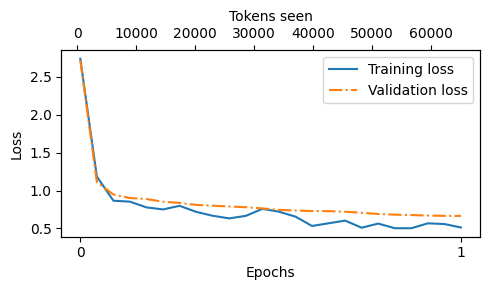

In [315]:
epochs_tensor = torch.linspace(0, num_epochs, len(train_loss))
plot_losses(epochs_tensor, tokens_seen, train_loss, val_loss)

# Extracting and Saving Responses

In [317]:
torch.manual_seed(123)


for entry in test_data[:3]:

    input_text = format_input(entry)

    token_ids = generate(
        model=model,
        idx=text_to_toke_ids(input_text, tokenizer).to(device),
        max_new_tokens=256,
        context_size=BASE_CONFIG["context_length"],
        eos_id=50256
    )
    generated_text = token_ids_to_text(token_ids, tokenizer)
    response_text = (
        generated_text[len(input_text):]
        .replace("### Response:", "")
        .strip()
)

    print(input_text)
    print(f"\nCorrect response:\n>> {entry['output']}")
    print(f"\nModel response:\n>> {response_text.strip()}")
    print("-------------------------------------")

Below is an instruction that describes a task. write a response that appropriately completes the request.

### Instruction:
Rewrite the sentence using a simile.

### Input:
The car is very fast.

Correct response:
>> The car is as fast as lightning.

Model response:
>> The car is very fast.
-------------------------------------
Below is an instruction that describes a task. write a response that appropriately completes the request.

### Instruction:
What type of cloud is typically associated with thunderstorms?

Correct response:
>> The type of cloud typically associated with thunderstorms is cumulonimbus.

Model response:
>> A thunderstorm is a type of storm that typically produces thunderstorms.
-------------------------------------
Below is an instruction that describes a task. write a response that appropriately completes the request.

### Instruction:
Name the author of 'Pride and Prejudice'.

Correct response:
>> Jane Austen.

Model response:
>> The author of 'Pride and Prejudice

In [318]:
from tqdm import tqdm

for i, entry in tqdm(enumerate(test_data), total=len(test_data)):

    input_text = format_input(entry)

    token_ids = generate(
        model=model,
        idx=text_to_toke_ids(input_text, tokenizer).to(device),
        max_new_tokens=256,
        context_size=BASE_CONFIG["context_length"],
        eos_id=50256
    )
    generated_text = token_ids_to_text(token_ids, tokenizer)
    response_text = generated_text[len(input_text):].replace("### Response:", "").strip()

    test_data[i]["model_response"] = response_text


with open("instruction-data-with-response.json", "w") as file:
    json.dump(test_data, file, indent=4)  # "indent" for pretty-printing

100%|██████████| 110/110 [35:17<00:00, 19.25s/it]  


In [319]:
print(test_data[0])

{'instruction': 'Rewrite the sentence using a simile.', 'input': 'The car is very fast.', 'output': 'The car is as fast as lightning.', 'model_response': 'The car is very fast.'}


In [320]:
file_name = f"{re.sub(r'[ ()]', '', CHOOSE_MODEL) }-sft.pth"
torch.save(model.state_dict(), file_name)
print(f"Model saved as {file_name}")

# Load model via
# model.load_state_dict(torch.load("gpt2-medium355M-sft.pth"))

Model saved as gpt2-medium355M-sft.pth


In [321]:
import psutil

def check_if_running(process_name):
    running = False
    for proc in psutil.process_iter(["name"]):
        if process_name in proc.info["name"]:
            running = True
            break
    return running

ollama_running = check_if_running("ollama")

if not ollama_running:
    raise RuntimeError("Ollama not running. Launch ollama before proceeding.")
print("Ollama running:", check_if_running("ollama"))

Ollama running: True


In [322]:
import urllib.request

def query_model(
    prompt,
    model="llama3",
    url="http://localhost:11434/api/chat"
):
    # Create the data payload as a dictionary
    data = {
        "model": model,
        "messages": [
            {"role": "user", "content": prompt}
        ],
        "options": {     # Settings below are required for deterministic responses
            "seed": 123,
            "temperature": 0,
            "num_ctx": 2048
        }
    }


    # Convert the dictionary to a JSON formatted string and encode it to bytes
    payload = json.dumps(data).encode("utf-8")

    # Create a request object, setting the method to POST and adding necessary headers
    request = urllib.request.Request(
        url,
        data=payload,
        method="POST"
    )
    request.add_header("Content-Type", "application/json")

    # Send the request and capture the response
    response_data = ""
    with urllib.request.urlopen(request) as response:
        # Read and decode the response
        while True:
            line = response.readline().decode("utf-8")
            if not line:
                break
            response_json = json.loads(line)
            response_data += response_json["message"]["content"]

    return response_data

In [323]:
model = "llama3"
result = query_model("What do Llamas eat?", model)
print(result)

HTTPError: HTTP Error 404: Not Found

In [324]:
for entry in test_data[:3]:
    prompt = (
        f"Given the input `{format_input(entry)}` "
        f"and correct output `{entry['output']}`, "
        f"score the model response `{entry['model_response']}`"
        f" on a scale from 0 to 100, where 100 is the best score. "
    )
    print("\nDataset response:")
    print(">>", entry['output'])
    print("\nModel response:")
    print(">>", entry["model_response"])
    print("\nScore:")
    print(">>", query_model(prompt))
    print("\n-------------------------")


Dataset response:
>> The car is as fast as lightning.

Model response:
>> The car is very fast.

Score:


HTTPError: HTTP Error 404: Not Found

In [ ]:
for entry in test_data[:2]:
    prompt = (
            f"Given the input `{format_input(entry)}` "
            f"and correct output `{entry['output']}`, "
            f"score the model response `{entry['model_response']}`"
            f" on a scale from 0 to 100, where 100 is the best score. "
            f"Respond with the integer number only."
        )
    score = query_model(prompt, model)
    print("\nDataset response:")
    print(">>", entry['output'])
    print("\nModel response:")
    print(">>", entry["model_response"])
    print("\nScore:")
    print(">>", query_model(prompt, model))
    print("\n-------------------------")

In [ ]:
def generate_model_scores(json_data, json_key, model="llama3"):
    scores = []
    for entry in tqdm(json_data, desc="Scoring entries"):
        prompt = (
            f"Given the input `{format_input(entry)}` "
            f"and correct output `{entry['output']}`, "
            f"score the model response `{entry[json_key]}`"
            f" on a scale from 0 to 100, where 100 is the best score. "
            f"Respond with the integer number only."
        )
        score = query_model(prompt, model)
        try:
            scores.append(int(score))
        except ValueError:
            print(f"Could not convert score: {score}")
            continue

    return scores